In [26]:
# Copyright (c) Meta Platforms, Inc. and affiliates.

# Video segmentation with SAM 2

This notebook shows how to use SAM 2 for interactive segmentation in videos. It will cover the following:

- adding clicks (or box) on a frame to get and refine _masklets_ (spatio-temporal masks)
- propagating clicks (or box) to get _masklets_ throughout the video
- segmenting and tracking multiple objects at the same time

We use the terms _segment_ or _mask_ to refer to the model prediction for an object on a single frame, and _masklet_ to refer to the spatio-temporal masks across the entire video. 

<a target="_blank" href="https://colab.research.google.com/github/facebookresearch/sam2/blob/main/notebooks/video_predictor_example.ipynb">
  <img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/>
</a>

## Environment Set-up

If running locally using jupyter, first install `sam2` in your environment using the [installation instructions](https://github.com/facebookresearch/sam2#installation) in the repository.

If running from Google Colab, set `using_colab=True` below and run the cell. In Colab, be sure to select 'GPU' under 'Edit'->'Notebook Settings'->'Hardware accelerator'. Note that it's recommended to use **A100 or L4 GPUs when running in Colab** (T4 GPUs might also work, but could be slow and might run out of memory in some cases).

In [27]:
using_colab = False

In [28]:
if using_colab:
    import torch
    import torchvision
    print("PyTorch version:", torch.__version__)
    print("Torchvision version:", torchvision.__version__)
    print("CUDA is available:", torch.cuda.is_available())
    import sys
    !{sys.executable} -m pip install opencv-python matplotlib
    !{sys.executable} -m pip install 'git+https://github.com/facebookresearch/sam2.git'

    !mkdir -p videos
    !wget -P videos https://dl.fbaipublicfiles.com/segment_anything_2/assets/bedroom.zip
    !unzip -d videos videos/bedroom.zip

    !mkdir -p ../checkpoints/
    !wget -P ../checkpoints/ https://dl.fbaipublicfiles.com/segment_anything_2/092824/sam2.1_hiera_large.pt

## Set-up

In [29]:
import os
# if using Apple MPS, fall back to CPU for unsupported ops
os.environ["PYTORCH_ENABLE_MPS_FALLBACK"] = "1"
import numpy as np
import torch
import matplotlib.pyplot as plt
from PIL import Image

In [30]:
# select the device for computation
if torch.cuda.is_available():
    device = torch.device("cuda")
elif torch.backends.mps.is_available():
    device = torch.device("mps")
else:
    device = torch.device("cpu")
print(f"using device: {device}")

if device.type == "cuda":
    # use bfloat16 for the entire notebook
    torch.autocast("cuda", dtype=torch.bfloat16).__enter__()
    # turn on tfloat32 for Ampere GPUs (https://pytorch.org/docs/stable/notes/cuda.html#tensorfloat-32-tf32-on-ampere-devices)
    if torch.cuda.get_device_properties(0).major >= 8:
        torch.backends.cuda.matmul.allow_tf32 = True
        torch.backends.cudnn.allow_tf32 = True
elif device.type == "mps":
    print(
        "\nSupport for MPS devices is preliminary. SAM 2 is trained with CUDA and might "
        "give numerically different outputs and sometimes degraded performance on MPS. "
        "See e.g. https://github.com/pytorch/pytorch/issues/84936 for a discussion."
    )

using device: cuda


### Loading the SAM 2 video predictor

In [31]:
import sys, os

sys.path.append(os.path.abspath('..'))

from sam2.build_sam import build_sam2_video_predictor

sam2_checkpoint = "../checkpoints/sam2.1_hiera_large.pt"
model_cfg = "configs/sam2.1/sam2.1_hiera_l.yaml"

predictor = build_sam2_video_predictor(model_cfg, sam2_checkpoint, device=device)

In [32]:
def show_mask(mask, ax, obj_id=None, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        cmap = plt.get_cmap("tab10")
        cmap_idx = 0 if obj_id is None else obj_id
        color = np.array([*cmap(cmap_idx)[:3], 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)


def show_points(coords, labels, ax, marker_size=200):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)


def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0, 0, 0, 0), lw=2))

#### Select an example video

We assume that the video is stored as a list of JPEG frames with filenames like `<frame_index>.jpg`.

For your custom videos, you can extract their JPEG frames using ffmpeg (https://ffmpeg.org/) as follows:
```
ffmpeg -i <your_video>.mp4 -q:v 2 -start_number 0 <output_dir>/'%05d.jpg'
```
where `-q:v` generates high-quality JPEG frames and `-start_number 0` asks ffmpeg to start the JPEG file from `00000.jpg`.

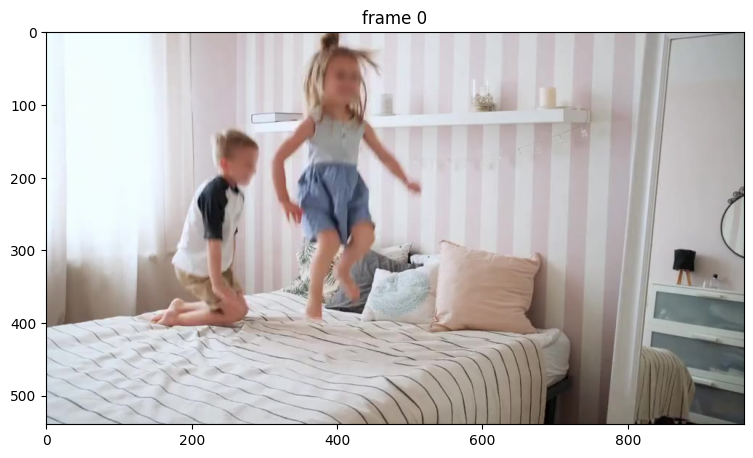

In [33]:
# `video_dir` a directory of JPEG frames with filenames like `<frame_index>.jpg`
video_dir = "./videos/bedroom"

# scan all the JPEG frame names in this directory
frame_names = [
    p for p in os.listdir(video_dir)
    if os.path.splitext(p)[-1] in [".jpg", ".jpeg", ".JPG", ".JPEG"]
]
frame_names.sort(key=lambda p: int(os.path.splitext(p)[0]))

# take a look the first video frame
frame_idx = 0
plt.figure(figsize=(9, 6))
plt.title(f"frame {frame_idx}")
plt.imshow(Image.open(os.path.join(video_dir, frame_names[frame_idx])))

#### Initialize the inference state

SAM 2 requires stateful inference for interactive video segmentation, so we need to initialize an **inference state** on this video.

During initialization, it loads all the JPEG frames in `video_path` and stores their pixels in `inference_state` (as shown in the progress bar below).

In [34]:
inference_state = predictor.init_state(video_path=video_dir)

frame loading (JPEG): 100%|██████████| 200/200 [00:06<00:00, 31.31it/s]


### Example 1: Segment & track one object

Note: if you have run any previous tracking using this `inference_state`, please reset it first via `reset_state`.

(The cell below is just for illustration; it's not needed to call `reset_state` here as this `inference_state` is just freshly initialized above.)

In [35]:
predictor.reset_state(inference_state)

#### Step 1: Add a first click on a frame

To get started, let's try to segment the child on the left.

Here we make a **positive click** at (x, y) = (210, 350) with label `1`, by sending their coordinates and labels into the `add_new_points_or_box` API.

Note: label `1` indicates a *positive click (to add a region)* while label `0` indicates a *negative click (to remove a region)*.

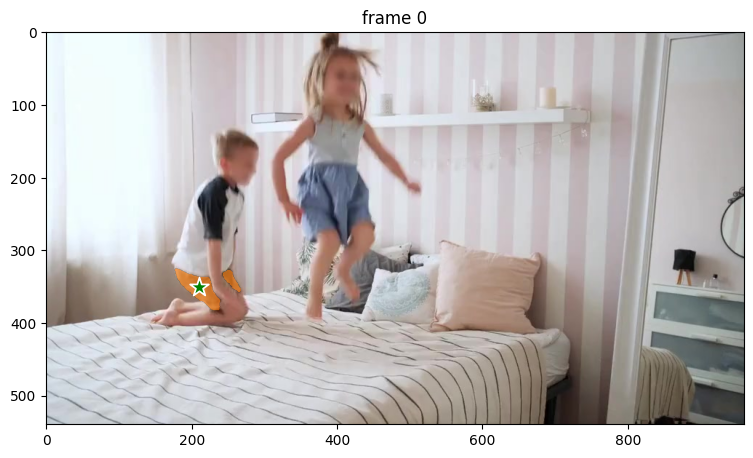

In [36]:
ann_frame_idx = 0  # the frame index we interact with
ann_obj_id = 1  # give a unique id to each object we interact with (it can be any integers)

# Let's add a positive click at (x, y) = (210, 350) to get started
points = np.array([[210, 350]], dtype=np.float32)
# for labels, `1` means positive click and `0` means negative click
labels = np.array([1], np.int32)
_, out_obj_ids, out_mask_logits = predictor.add_new_points_or_box(
    inference_state=inference_state,
    frame_idx=ann_frame_idx,
    obj_id=ann_obj_id,
    points=points,
    labels=labels,
)

# show the results on the current (interacted) frame
plt.figure(figsize=(9, 6))
plt.title(f"frame {ann_frame_idx}")
plt.imshow(Image.open(os.path.join(video_dir, frame_names[ann_frame_idx])))
show_points(points, labels, plt.gca())
show_mask((out_mask_logits[0] > 0.0).cpu().numpy(), plt.gca(), obj_id=out_obj_ids[0])

#### Step 2: Add a second click to refine the prediction

Hmm, it seems that although we wanted to segment the child on the left, the model predicts the mask for only the shorts -- this can happen since there is ambiguity from a single click about what the target object should be. We can refine the mask on this frame via another positive click on the child's shirt.

Here we make a **second positive click** at (x, y) = (250, 220) with label `1` to expand the mask.

Note: we need to send **all the clicks and their labels** (i.e. not just the last click) when calling `add_new_points_or_box`.

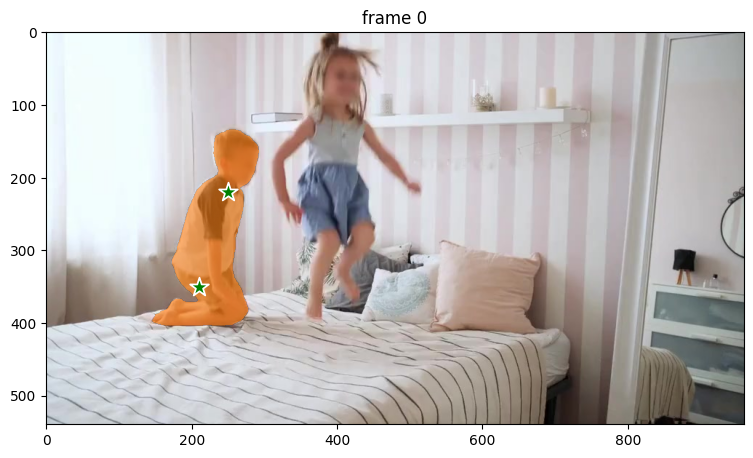

In [37]:
ann_frame_idx = 0  # the frame index we interact with
ann_obj_id = 1  # give a unique id to each object we interact with (it can be any integers)

# Let's add a 2nd positive click at (x, y) = (250, 220) to refine the mask
# sending all clicks (and their labels) to `add_new_points_or_box`
points = np.array([[210, 350], [250, 220]], dtype=np.float32)
# for labels, `1` means positive click and `0` means negative click
labels = np.array([1, 1], np.int32)
_, out_obj_ids, out_mask_logits = predictor.add_new_points_or_box(
    inference_state=inference_state,
    frame_idx=ann_frame_idx,
    obj_id=ann_obj_id,
    points=points,
    labels=labels,
)

# show the results on the current (interacted) frame
plt.figure(figsize=(9, 6))
plt.title(f"frame {ann_frame_idx}")
plt.imshow(Image.open(os.path.join(video_dir, frame_names[ann_frame_idx])))
show_points(points, labels, plt.gca())
show_mask((out_mask_logits[0] > 0.0).cpu().numpy(), plt.gca(), obj_id=out_obj_ids[0])

With this 2nd refinement click, now we get a segmentation mask of the entire child on frame 0.

#### Step 3: Propagate the prompts to get the masklet across the video

To get the masklet throughout the entire video, we propagate the prompts using the `propagate_in_video` API.

propagate in video:   1%|          | 2/200 [00:00<00:11, 17.75it/s]

Skipping frame 1 due to low masked MAD (0.00)
Skipping frame 2 due to low masked MAD (0.00)


propagate in video:   3%|▎         | 6/200 [00:00<00:29,  6.64it/s]

Skipping frame 4 due to low masked MAD (0.00)
Skipping frame 5 due to low masked MAD (0.00)
Skipping frame 6 due to low masked MAD (0.00)


propagate in video:   5%|▌         | 10/200 [00:01<00:32,  5.77it/s]

Skipping frame 8 due to low masked MAD (0.00)
Skipping frame 9 due to low masked MAD (0.00)


propagate in video:   6%|▋         | 13/200 [00:02<00:37,  5.01it/s]

Skipping frame 11 due to low masked MAD (0.00)
Skipping frame 12 due to low masked MAD (0.00)
Skipping frame 13 due to low masked MAD (0.00)


propagate in video:   8%|▊         | 17/200 [00:03<00:36,  5.05it/s]

Skipping frame 15 due to low masked MAD (0.00)
Skipping frame 16 due to low masked MAD (0.00)


propagate in video:  10%|█         | 20/200 [00:04<00:38,  4.67it/s]

Skipping frame 18 due to low masked MAD (0.00)
Skipping frame 19 due to low masked MAD (0.00)
Skipping frame 20 due to low masked MAD (0.00)


propagate in video:  12%|█▏        | 24/200 [00:05<00:36,  4.87it/s]

Skipping frame 22 due to low masked MAD (0.00)
Skipping frame 23 due to low masked MAD (0.00)
Skipping frame 24 due to low masked MAD (0.00)


propagate in video:  14%|█▍        | 28/200 [00:05<00:23,  7.24it/s]

Skipping frame 25 due to low masked MAD (0.00)
Skipping frame 26 due to low masked MAD (0.00)
Skipping frame 27 due to low masked MAD (0.00)


propagate in video:  16%|█▌        | 32/200 [00:06<00:27,  6.02it/s]

Skipping frame 29 due to low masked MAD (0.00)
Skipping frame 30 due to low masked MAD (0.00)
Avg FPS last 30 frames: 4.78
Skipping frame 31 due to low masked MAD (0.00)


propagate in video:  17%|█▋        | 34/200 [00:06<00:23,  7.14it/s]

Skipping frame 32 due to low masked MAD (0.00)
Skipping frame 33 due to low masked MAD (0.00)
Skipping frame 34 due to low masked MAD (0.00)


propagate in video:  19%|█▉        | 38/200 [00:06<00:17,  9.30it/s]

Skipping frame 35 due to low masked MAD (0.00)
Skipping frame 36 due to low masked MAD (0.00)
Skipping frame 37 due to low masked MAD (0.00)


propagate in video:  20%|██        | 40/200 [00:06<00:15, 10.18it/s]

Skipping frame 38 due to low masked MAD (0.00)
Skipping frame 39 due to low masked MAD (0.00)
Skipping frame 40 due to low masked MAD (0.00)


propagate in video:  22%|██▏       | 44/200 [00:07<00:23,  6.74it/s]

Skipping frame 42 due to low masked MAD (0.00)
Skipping frame 43 due to low masked MAD (0.00)
Skipping frame 44 due to low masked MAD (0.00)


propagate in video:  24%|██▍       | 48/200 [00:08<00:17,  8.76it/s]

Skipping frame 45 due to low masked MAD (0.00)
Skipping frame 46 due to low masked MAD (0.00)
Skipping frame 47 due to low masked MAD (0.00)


propagate in video:  25%|██▌       | 50/200 [00:08<00:15,  9.70it/s]

Skipping frame 48 due to low masked MAD (0.00)
Skipping frame 49 due to low masked MAD (0.00)
Skipping frame 50 due to low masked MAD (0.00)


propagate in video:  27%|██▋       | 54/200 [00:08<00:13, 11.18it/s]

Skipping frame 51 due to low masked MAD (0.00)
Skipping frame 52 due to low masked MAD (0.00)
Skipping frame 53 due to low masked MAD (0.00)
Skipping frame 54 due to low masked MAD (0.00)


propagate in video:  29%|██▉       | 58/200 [00:08<00:11, 12.08it/s]

Skipping frame 55 due to low masked MAD (0.00)
Skipping frame 56 due to low masked MAD (0.00)
Skipping frame 57 due to low masked MAD (0.00)


propagate in video:  30%|███       | 60/200 [00:09<00:11, 12.22it/s]

Skipping frame 58 due to low masked MAD (0.00)
Skipping frame 59 due to low masked MAD (0.00)
Skipping frame 60 due to low masked MAD (0.00)
Avg FPS last 30 frames: 10.34


propagate in video:  31%|███       | 62/200 [00:09<00:10, 12.58it/s]

Skipping frame 61 due to low masked MAD (0.00)
Skipping frame 62 due to low masked MAD (0.00)


propagate in video:  33%|███▎      | 66/200 [00:10<00:18,  7.11it/s]

Skipping frame 64 due to low masked MAD (0.00)
Skipping frame 65 due to low masked MAD (0.00)
Skipping frame 66 due to low masked MAD (0.00)


propagate in video:  35%|███▌      | 70/200 [00:10<00:14,  9.22it/s]

Skipping frame 67 due to low masked MAD (0.00)
Skipping frame 68 due to low masked MAD (0.00)
Skipping frame 69 due to low masked MAD (0.00)


propagate in video:  37%|███▋      | 74/200 [00:11<00:19,  6.54it/s]

Skipping frame 71 due to low masked MAD (0.00)
Skipping frame 72 due to low masked MAD (0.00)
Skipping frame 73 due to low masked MAD (0.00)
Skipping frame 74 due to low masked MAD (0.00)


propagate in video:  39%|███▉      | 78/200 [00:12<00:21,  5.71it/s]

Skipping frame 76 due to low masked MAD (0.00)
Skipping frame 77 due to low masked MAD (0.00)
Skipping frame 78 due to low masked MAD (0.00)


propagate in video:  41%|████      | 82/200 [00:12<00:14,  7.98it/s]

Skipping frame 79 due to low masked MAD (0.00)
Skipping frame 80 due to low masked MAD (0.00)
Skipping frame 81 due to low masked MAD (0.00)


propagate in video:  43%|████▎     | 86/200 [00:13<00:18,  6.17it/s]

Skipping frame 83 due to low masked MAD (0.00)
Skipping frame 84 due to low masked MAD (0.00)
Skipping frame 85 due to low masked MAD (0.00)


propagate in video:  44%|████▍     | 88/200 [00:13<00:15,  7.36it/s]

Skipping frame 86 due to low masked MAD (0.00)
Skipping frame 87 due to low masked MAD (0.00)


propagate in video:  46%|████▌     | 92/200 [00:14<00:18,  5.99it/s]

Skipping frame 89 due to low masked MAD (0.00)
Skipping frame 90 due to low masked MAD (0.00)
Avg FPS last 30 frames: 5.76
Skipping frame 91 due to low masked MAD (0.00)


propagate in video:  47%|████▋     | 94/200 [00:14<00:14,  7.19it/s]

Skipping frame 92 due to low masked MAD (0.00)
Skipping frame 93 due to low masked MAD (0.00)
Skipping frame 94 due to low masked MAD (0.00)


propagate in video:  49%|████▉     | 98/200 [00:15<00:17,  5.98it/s]

Skipping frame 96 due to low masked MAD (0.00)
Skipping frame 97 due to low masked MAD (0.00)
Skipping frame 98 due to low masked MAD (0.00)


propagate in video:  50%|█████     | 100/200 [00:15<00:13,  7.15it/s]

Skipping frame 99 due to low masked MAD (0.00)


propagate in video:  52%|█████▏    | 104/200 [00:16<00:16,  5.95it/s]

Skipping frame 101 due to low masked MAD (0.00)
Skipping frame 102 due to low masked MAD (0.00)
Skipping frame 103 due to low masked MAD (0.00)


propagate in video:  53%|█████▎    | 106/200 [00:16<00:13,  7.11it/s]

Skipping frame 104 due to low masked MAD (0.00)
Skipping frame 105 due to low masked MAD (0.00)


propagate in video:  55%|█████▌    | 110/200 [00:17<00:15,  5.92it/s]

Skipping frame 107 due to low masked MAD (0.00)
Skipping frame 108 due to low masked MAD (0.00)
Skipping frame 109 due to low masked MAD (0.00)
Skipping frame 110 due to low masked MAD (0.00)


propagate in video:  57%|█████▋    | 114/200 [00:18<00:15,  5.48it/s]

Skipping frame 112 due to low masked MAD (0.00)
Skipping frame 113 due to low masked MAD (0.00)
Skipping frame 114 due to low masked MAD (0.00)


propagate in video:  59%|█████▉    | 118/200 [00:19<00:15,  5.29it/s]

Skipping frame 116 due to low masked MAD (0.00)
Skipping frame 117 due to low masked MAD (0.00)


propagate in video:  60%|██████    | 121/200 [00:20<00:16,  4.86it/s]

Skipping frame 119 due to low masked MAD (0.00)
Skipping frame 120 due to low masked MAD (0.00)
Avg FPS last 30 frames: 5.21
Skipping frame 121 due to low masked MAD (0.00)


propagate in video:  62%|██████▏   | 123/200 [00:20<00:19,  3.89it/s]

Skipping frame 123 due to low masked MAD (0.00)


propagate in video:  63%|██████▎   | 126/200 [00:21<00:18,  3.91it/s]

Skipping frame 125 due to low masked MAD (0.00)


propagate in video:  64%|██████▍   | 129/200 [00:22<00:17,  4.07it/s]

Skipping frame 127 due to low masked MAD (0.00)
Skipping frame 128 due to low masked MAD (0.00)


propagate in video:  65%|██████▌   | 130/200 [00:23<00:23,  2.99it/s]

Skipping frame 130 due to low masked MAD (0.00)


propagate in video:  66%|██████▋   | 133/200 [00:24<00:19,  3.36it/s]

Skipping frame 132 due to low masked MAD (0.00)


propagate in video:  67%|██████▋   | 134/200 [00:24<00:25,  2.62it/s]

Skipping frame 134 due to low masked MAD (0.00)


propagate in video:  68%|██████▊   | 136/200 [00:25<00:24,  2.65it/s]

Skipping frame 136 due to low masked MAD (0.00)


propagate in video:  70%|███████   | 140/200 [00:26<00:16,  3.69it/s]

Skipping frame 138 due to low masked MAD (0.00)
Skipping frame 139 due to low masked MAD (0.00)


propagate in video:  70%|███████   | 141/200 [00:26<00:20,  2.89it/s]

Skipping frame 141 due to low masked MAD (0.00)


propagate in video:  72%|███████▏  | 143/200 [00:27<00:19,  2.85it/s]

Skipping frame 143 due to low masked MAD (0.00)


propagate in video:  74%|███████▎  | 147/200 [00:28<00:14,  3.75it/s]

Skipping frame 145 due to low masked MAD (0.00)
Skipping frame 146 due to low masked MAD (0.00)


propagate in video:  74%|███████▍  | 149/200 [00:29<00:14,  3.45it/s]

Skipping frame 148 due to low masked MAD (0.00)


propagate in video:  75%|███████▌  | 150/200 [00:29<00:18,  2.70it/s]

Skipping frame 150 due to low masked MAD (0.00)
Avg FPS last 30 frames: 3.02


propagate in video:  76%|███████▌  | 152/200 [00:30<00:17,  2.72it/s]

Skipping frame 152 due to low masked MAD (0.00)


propagate in video:  77%|███████▋  | 154/200 [00:31<00:16,  2.73it/s]

Skipping frame 154 due to low masked MAD (0.00)


propagate in video:  78%|███████▊  | 156/200 [00:32<00:16,  2.73it/s]

Skipping frame 156 due to low masked MAD (0.00)


propagate in video:  79%|███████▉  | 158/200 [00:32<00:15,  2.73it/s]

Skipping frame 158 due to low masked MAD (0.00)


propagate in video:  81%|████████  | 162/200 [00:33<00:10,  3.66it/s]

Skipping frame 160 due to low masked MAD (0.00)
Skipping frame 161 due to low masked MAD (0.00)


propagate in video:  82%|████████▎ | 165/200 [00:34<00:08,  3.97it/s]

Skipping frame 163 due to low masked MAD (0.00)
Skipping frame 164 due to low masked MAD (0.00)


propagate in video:  83%|████████▎ | 166/200 [00:35<00:11,  3.03it/s]

Skipping frame 166 due to low masked MAD (0.00)


propagate in video:  84%|████████▍ | 168/200 [00:35<00:10,  2.93it/s]

Skipping frame 168 due to low masked MAD (0.00)


propagate in video:  86%|████████▌ | 172/200 [00:36<00:07,  3.82it/s]

Skipping frame 170 due to low masked MAD (0.00)
Skipping frame 171 due to low masked MAD (0.00)


propagate in video:  86%|████████▋ | 173/200 [00:37<00:09,  2.97it/s]

Skipping frame 173 due to low masked MAD (0.00)


propagate in video:  88%|████████▊ | 177/200 [00:38<00:05,  3.90it/s]

Skipping frame 175 due to low masked MAD (0.00)
Skipping frame 176 due to low masked MAD (0.00)


propagate in video:  90%|█████████ | 180/200 [00:39<00:04,  4.09it/s]

Skipping frame 178 due to low masked MAD (0.00)
Skipping frame 179 due to low masked MAD (0.00)
Skipping frame 180 due to low masked MAD (0.00)
Avg FPS last 30 frames: 3.25


propagate in video:  91%|█████████ | 182/200 [00:39<00:03,  5.35it/s]

Skipping frame 181 due to low masked MAD (0.00)


propagate in video:  92%|█████████▏| 183/200 [00:40<00:04,  3.61it/s]

Skipping frame 183 due to low masked MAD (0.00)


propagate in video:  92%|█████████▎| 185/200 [00:40<00:04,  3.23it/s]

Skipping frame 185 due to low masked MAD (0.00)


propagate in video:  94%|█████████▎| 187/200 [00:41<00:04,  3.06it/s]

Skipping frame 187 due to low masked MAD (0.00)


propagate in video:  96%|█████████▌| 191/200 [00:42<00:02,  3.89it/s]

Skipping frame 189 due to low masked MAD (0.00)
Skipping frame 190 due to low masked MAD (0.00)


propagate in video:  96%|█████████▌| 192/200 [00:43<00:02,  3.02it/s]

Skipping frame 192 due to low masked MAD (0.00)


propagate in video:  97%|█████████▋| 194/200 [00:43<00:02,  2.92it/s]

Skipping frame 194 due to low masked MAD (0.00)


propagate in video:  99%|█████████▉| 198/200 [00:44<00:00,  3.77it/s]

Skipping frame 196 due to low masked MAD (0.00)
Skipping frame 197 due to low masked MAD (0.00)


propagate in video: 100%|██████████| 200/200 [00:45<00:00,  4.41it/s]


Skipping frame 199 due to low masked MAD (0.00)
Skipped 147 frames due to low MAD.


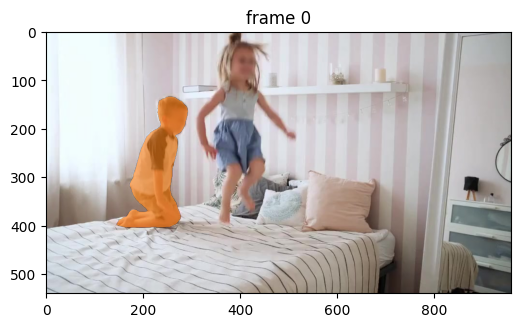

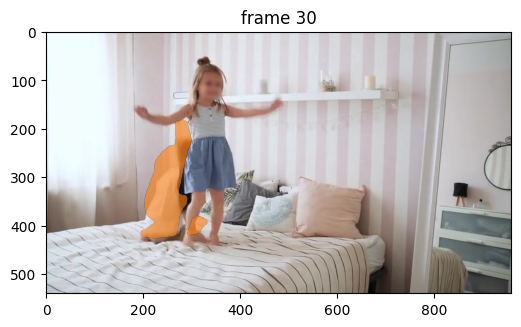

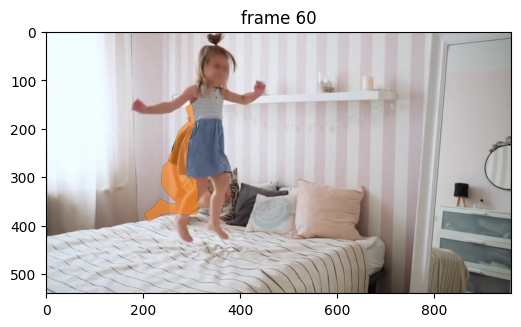

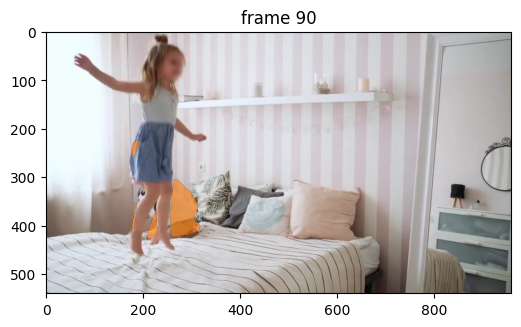

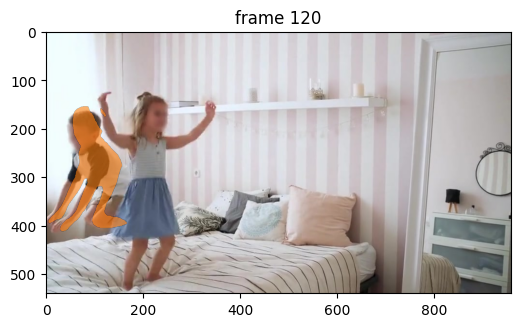

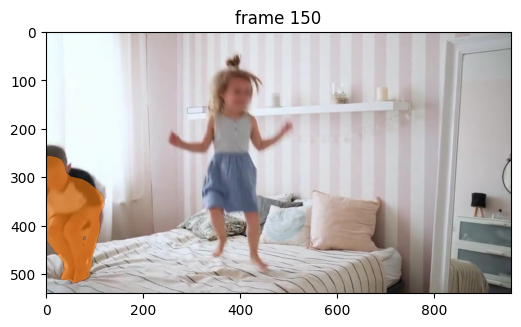

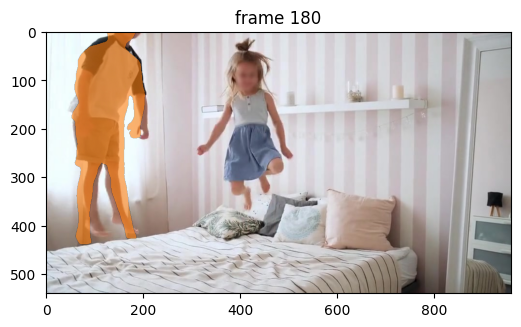

In [38]:
# run propagation throughout the video and collect the results in a dict
video_segments = {}  # video_segments contains the per-frame segmentation results
for out_frame_idx, out_obj_ids, out_mask_logits in predictor.propagate_in_video(inference_state):
    video_segments[out_frame_idx] = {
        out_obj_id: (out_mask_logits[i] > 0.0).cpu().numpy()
        for i, out_obj_id in enumerate(out_obj_ids)
    }

# render the segmentation results every few frames
vis_frame_stride = 30
plt.close("all")
for out_frame_idx in range(0, len(frame_names), vis_frame_stride):
    plt.figure(figsize=(6, 4))
    plt.title(f"frame {out_frame_idx}")
    plt.imshow(Image.open(os.path.join(video_dir, frame_names[out_frame_idx])))
    for out_obj_id, out_mask in video_segments[out_frame_idx].items():
        show_mask(out_mask, plt.gca(), obj_id=out_obj_id)

#### Step 4: Add new prompts to further refine the masklet

It appears that in the output masklet above, there are some small imperfections in boundary details on frame 150.

With SAM 2 we can fix the model predictions interactively. We can add a **negative click** at (x, y) = (82, 415) on this frame with label `0` to refine the masklet. Here we call the `add_new_points_or_box` API with a different `frame_idx` argument to indicate the frame index we want to refine.

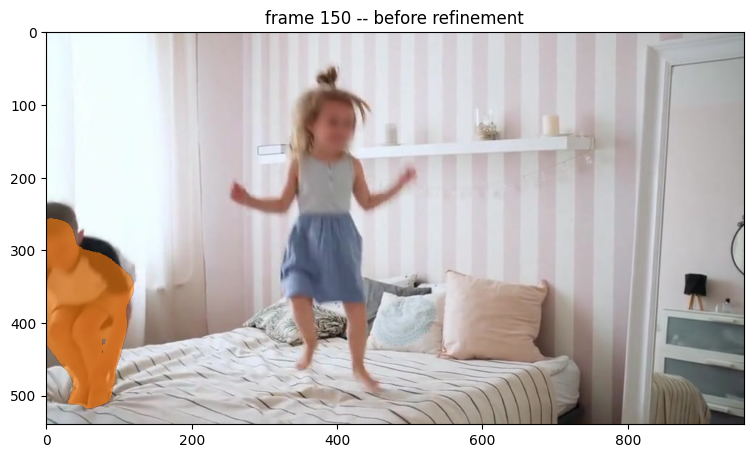

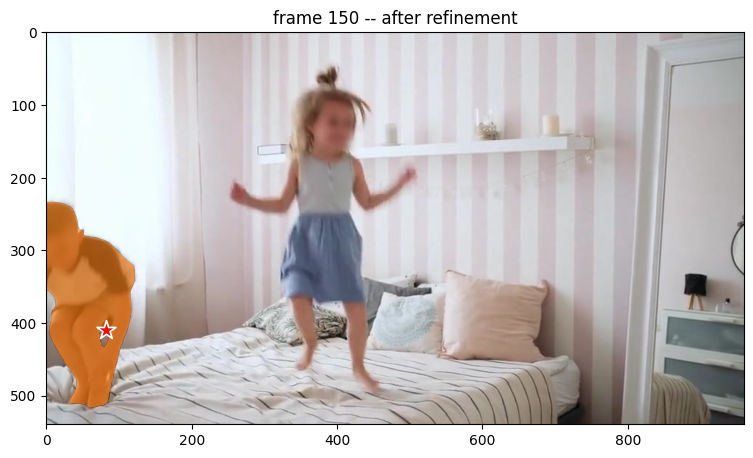

In [39]:
ann_frame_idx = 150  # further refine some details on this frame
ann_obj_id = 1  # give a unique id to the object we interact with (it can be any integers)

# show the segment before further refinement
plt.figure(figsize=(9, 6))
plt.title(f"frame {ann_frame_idx} -- before refinement")
plt.imshow(Image.open(os.path.join(video_dir, frame_names[ann_frame_idx])))
show_mask(video_segments[ann_frame_idx][ann_obj_id], plt.gca(), obj_id=ann_obj_id)

# Let's add a negative click on this frame at (x, y) = (82, 415) to refine the segment
points = np.array([[82, 410]], dtype=np.float32)
# for labels, `1` means positive click and `0` means negative click
labels = np.array([0], np.int32)
_, _, out_mask_logits = predictor.add_new_points_or_box(
    inference_state=inference_state,
    frame_idx=ann_frame_idx,
    obj_id=ann_obj_id,
    points=points,
    labels=labels,
)

# show the segment after the further refinement
plt.figure(figsize=(9, 6))
plt.title(f"frame {ann_frame_idx} -- after refinement")
plt.imshow(Image.open(os.path.join(video_dir, frame_names[ann_frame_idx])))
show_points(points, labels, plt.gca())
show_mask((out_mask_logits > 0.0).cpu().numpy(), plt.gca(), obj_id=ann_obj_id)

#### Step 5: Propagate the prompts (again) to get the masklet across the video

Let's get an updated masklet for the entire video. Here we call `propagate_in_video` again to propagate all the prompts after adding the new refinement click above.

propagate in video:   2%|▏         | 3/200 [00:00<00:10, 18.71it/s]

Skipping frame 1 due to low masked MAD (0.00)
Skipping frame 2 due to low masked MAD (0.00)


propagate in video:   4%|▎         | 7/200 [00:01<00:28,  6.74it/s]

Skipping frame 4 due to low masked MAD (0.00)
Skipping frame 5 due to low masked MAD (0.00)
Skipping frame 6 due to low masked MAD (0.00)


propagate in video:   4%|▍         | 9/200 [00:01<00:42,  4.44it/s]

Skipping frame 8 due to low masked MAD (0.00)
Skipping frame 9 due to low masked MAD (0.00)


propagate in video:   6%|▋         | 13/200 [00:02<00:38,  4.87it/s]

Skipping frame 11 due to low masked MAD (0.00)
Skipping frame 12 due to low masked MAD (0.00)
Skipping frame 13 due to low masked MAD (0.00)


propagate in video:   8%|▊         | 17/200 [00:03<00:36,  4.99it/s]

Skipping frame 15 due to low masked MAD (0.00)
Skipping frame 16 due to low masked MAD (0.00)


propagate in video:  10%|█         | 20/200 [00:04<00:38,  4.72it/s]

Skipping frame 18 due to low masked MAD (0.00)
Skipping frame 19 due to low masked MAD (0.00)
Skipping frame 20 due to low masked MAD (0.00)


propagate in video:  12%|█▏        | 24/200 [00:05<00:35,  4.94it/s]

Skipping frame 22 due to low masked MAD (0.00)
Skipping frame 23 due to low masked MAD (0.00)
Skipping frame 24 due to low masked MAD (0.00)


propagate in video:  14%|█▍        | 28/200 [00:05<00:23,  7.36it/s]

Skipping frame 25 due to low masked MAD (0.00)
Skipping frame 26 due to low masked MAD (0.00)
Skipping frame 27 due to low masked MAD (0.00)


propagate in video:  16%|█▌        | 32/200 [00:06<00:27,  6.02it/s]

Skipping frame 29 due to low masked MAD (0.00)
Skipping frame 30 due to low masked MAD (0.00)
Avg FPS last 30 frames: 4.79
Skipping frame 31 due to low masked MAD (0.00)


propagate in video:  17%|█▋        | 34/200 [00:06<00:22,  7.23it/s]

Skipping frame 32 due to low masked MAD (0.00)
Skipping frame 33 due to low masked MAD (0.00)
Skipping frame 34 due to low masked MAD (0.00)


propagate in video:  19%|█▉        | 38/200 [00:06<00:17,  9.28it/s]

Skipping frame 35 due to low masked MAD (0.00)
Skipping frame 36 due to low masked MAD (0.00)
Skipping frame 37 due to low masked MAD (0.00)


propagate in video:  20%|██        | 40/200 [00:06<00:15, 10.24it/s]

Skipping frame 38 due to low masked MAD (0.00)
Skipping frame 39 due to low masked MAD (0.00)
Skipping frame 40 due to low masked MAD (0.00)


propagate in video:  22%|██▏       | 44/200 [00:07<00:22,  6.80it/s]

Skipping frame 42 due to low masked MAD (0.00)
Skipping frame 43 due to low masked MAD (0.00)
Skipping frame 44 due to low masked MAD (0.00)


propagate in video:  24%|██▍       | 48/200 [00:08<00:16,  9.00it/s]

Skipping frame 45 due to low masked MAD (0.00)
Skipping frame 46 due to low masked MAD (0.00)
Skipping frame 47 due to low masked MAD (0.00)


propagate in video:  25%|██▌       | 50/200 [00:08<00:15,  9.94it/s]

Skipping frame 48 due to low masked MAD (0.00)
Skipping frame 49 due to low masked MAD (0.00)
Skipping frame 50 due to low masked MAD (0.00)


propagate in video:  27%|██▋       | 54/200 [00:08<00:12, 11.26it/s]

Skipping frame 51 due to low masked MAD (0.00)
Skipping frame 52 due to low masked MAD (0.00)
Skipping frame 53 due to low masked MAD (0.00)


propagate in video:  28%|██▊       | 56/200 [00:08<00:12, 11.78it/s]

Skipping frame 54 due to low masked MAD (0.00)
Skipping frame 55 due to low masked MAD (0.00)
Skipping frame 56 due to low masked MAD (0.00)


propagate in video:  30%|███       | 60/200 [00:09<00:11, 12.32it/s]

Skipping frame 57 due to low masked MAD (0.00)
Skipping frame 58 due to low masked MAD (0.00)
Skipping frame 59 due to low masked MAD (0.00)


propagate in video:  31%|███       | 62/200 [00:09<00:11, 12.54it/s]

Skipping frame 60 due to low masked MAD (0.00)
Avg FPS last 30 frames: 10.46
Skipping frame 61 due to low masked MAD (0.00)
Skipping frame 62 due to low masked MAD (0.00)


propagate in video:  33%|███▎      | 66/200 [00:10<00:19,  7.05it/s]

Skipping frame 64 due to low masked MAD (0.00)
Skipping frame 65 due to low masked MAD (0.00)
Skipping frame 66 due to low masked MAD (0.00)


propagate in video:  35%|███▌      | 70/200 [00:10<00:14,  9.02it/s]

Skipping frame 67 due to low masked MAD (0.00)
Skipping frame 68 due to low masked MAD (0.00)
Skipping frame 69 due to low masked MAD (0.00)


propagate in video:  37%|███▋      | 74/200 [00:11<00:19,  6.39it/s]

Skipping frame 71 due to low masked MAD (0.00)
Skipping frame 72 due to low masked MAD (0.00)
Skipping frame 73 due to low masked MAD (0.00)
Skipping frame 74 due to low masked MAD (0.00)


propagate in video:  38%|███▊      | 77/200 [00:12<00:24,  4.94it/s]

Skipping frame 76 due to low masked MAD (0.00)
Skipping frame 77 due to low masked MAD (0.00)
Skipping frame 78 due to low masked MAD (0.00)


propagate in video:  40%|████      | 81/200 [00:12<00:17,  6.88it/s]

Skipping frame 79 due to low masked MAD (0.00)
Skipping frame 80 due to low masked MAD (0.00)
Skipping frame 81 due to low masked MAD (0.00)


propagate in video:  42%|████▎     | 85/200 [00:13<00:21,  5.40it/s]

Skipping frame 83 due to low masked MAD (0.00)
Skipping frame 84 due to low masked MAD (0.00)
Skipping frame 85 due to low masked MAD (0.00)


propagate in video:  44%|████▎     | 87/200 [00:13<00:17,  6.37it/s]

Skipping frame 86 due to low masked MAD (0.00)
Skipping frame 87 due to low masked MAD (0.00)


propagate in video:  46%|████▌     | 91/200 [00:14<00:20,  5.35it/s]

Skipping frame 89 due to low masked MAD (0.00)
Skipping frame 90 due to low masked MAD (0.00)
Avg FPS last 30 frames: 5.32
Skipping frame 91 due to low masked MAD (0.00)


propagate in video:  48%|████▊     | 95/200 [00:15<00:13,  7.76it/s]

Skipping frame 92 due to low masked MAD (0.00)
Skipping frame 93 due to low masked MAD (0.00)
Skipping frame 94 due to low masked MAD (0.00)


propagate in video:  50%|████▉     | 99/200 [00:15<00:15,  6.37it/s]

Skipping frame 96 due to low masked MAD (0.00)
Skipping frame 97 due to low masked MAD (0.00)
Skipping frame 98 due to low masked MAD (0.00)
Skipping frame 99 due to low masked MAD (0.00)


propagate in video:  52%|█████▏    | 103/200 [00:16<00:16,  5.72it/s]

Skipping frame 101 due to low masked MAD (0.00)
Skipping frame 102 due to low masked MAD (0.00)
Skipping frame 103 due to low masked MAD (0.00)


propagate in video:  52%|█████▎    | 105/200 [00:16<00:13,  6.86it/s]

Skipping frame 104 due to low masked MAD (0.00)
Skipping frame 105 due to low masked MAD (0.00)


propagate in video:  55%|█████▍    | 109/200 [00:17<00:15,  5.97it/s]

Skipping frame 107 due to low masked MAD (0.00)
Skipping frame 108 due to low masked MAD (0.00)
Skipping frame 109 due to low masked MAD (0.00)


propagate in video:  56%|█████▌    | 111/200 [00:17<00:12,  7.23it/s]

Skipping frame 110 due to low masked MAD (0.00)


propagate in video:  57%|█████▊    | 115/200 [00:18<00:13,  6.07it/s]

Skipping frame 112 due to low masked MAD (0.00)
Skipping frame 113 due to low masked MAD (0.00)
Skipping frame 114 due to low masked MAD (0.00)


propagate in video:  58%|█████▊    | 117/200 [00:19<00:18,  4.49it/s]

Skipping frame 116 due to low masked MAD (0.00)
Skipping frame 117 due to low masked MAD (0.00)


propagate in video:  60%|██████    | 121/200 [00:20<00:16,  4.82it/s]

Skipping frame 119 due to low masked MAD (0.00)
Skipping frame 120 due to low masked MAD (0.00)
Avg FPS last 30 frames: 5.36
Skipping frame 121 due to low masked MAD (0.00)


propagate in video:  62%|██████▏   | 123/200 [00:21<00:19,  3.98it/s]

Skipping frame 123 due to low masked MAD (0.00)


propagate in video:  62%|██████▎   | 125/200 [00:21<00:21,  3.53it/s]

Skipping frame 125 due to low masked MAD (0.00)


propagate in video:  64%|██████▍   | 129/200 [00:22<00:17,  4.15it/s]

Skipping frame 127 due to low masked MAD (0.00)
Skipping frame 128 due to low masked MAD (0.00)


propagate in video:  65%|██████▌   | 130/200 [00:23<00:21,  3.21it/s]

Skipping frame 130 due to low masked MAD (0.00)


propagate in video:  66%|██████▌   | 132/200 [00:24<00:22,  3.05it/s]

Skipping frame 132 due to low masked MAD (0.00)


propagate in video:  67%|██████▋   | 134/200 [00:24<00:22,  2.95it/s]

Skipping frame 134 due to low masked MAD (0.00)


propagate in video:  68%|██████▊   | 136/200 [00:25<00:22,  2.85it/s]

Skipping frame 136 due to low masked MAD (0.00)


propagate in video:  70%|███████   | 140/200 [00:26<00:16,  3.71it/s]

Skipping frame 138 due to low masked MAD (0.00)
Skipping frame 139 due to low masked MAD (0.00)


propagate in video:  70%|███████   | 141/200 [00:27<00:19,  2.98it/s]

Skipping frame 141 due to low masked MAD (0.00)


propagate in video:  72%|███████▏  | 143/200 [00:27<00:19,  2.87it/s]

Skipping frame 143 due to low masked MAD (0.00)


propagate in video:  74%|███████▎  | 147/200 [00:28<00:14,  3.75it/s]

Skipping frame 145 due to low masked MAD (0.00)
Skipping frame 146 due to low masked MAD (0.00)


propagate in video:  74%|███████▍  | 148/200 [00:29<00:17,  2.94it/s]

Skipping frame 148 due to low masked MAD (0.00)


propagate in video:  75%|███████▌  | 150/200 [00:30<00:17,  2.84it/s]

Skipping frame 150 due to low masked MAD (0.00)
Avg FPS last 30 frames: 3.06


propagate in video:  76%|███████▌  | 152/200 [00:30<00:17,  2.80it/s]

Skipping frame 152 due to low masked MAD (0.00)


propagate in video:  77%|███████▋  | 154/200 [00:31<00:16,  2.78it/s]

Skipping frame 154 due to low masked MAD (0.00)


propagate in video:  78%|███████▊  | 156/200 [00:32<00:15,  2.75it/s]

Skipping frame 156 due to low masked MAD (0.00)


propagate in video:  79%|███████▉  | 158/200 [00:33<00:15,  2.76it/s]

Skipping frame 158 due to low masked MAD (0.00)


propagate in video:  81%|████████  | 162/200 [00:33<00:10,  3.63it/s]

Skipping frame 160 due to low masked MAD (0.00)
Skipping frame 161 due to low masked MAD (0.00)


propagate in video:  82%|████████▎ | 165/200 [00:34<00:08,  3.97it/s]

Skipping frame 163 due to low masked MAD (0.00)
Skipping frame 164 due to low masked MAD (0.00)


propagate in video:  83%|████████▎ | 166/200 [00:35<00:11,  3.04it/s]

Skipping frame 166 due to low masked MAD (0.00)


propagate in video:  84%|████████▍ | 168/200 [00:36<00:10,  2.92it/s]

Skipping frame 168 due to low masked MAD (0.00)


propagate in video:  86%|████████▌ | 172/200 [00:36<00:07,  3.80it/s]

Skipping frame 170 due to low masked MAD (0.00)
Skipping frame 171 due to low masked MAD (0.00)


propagate in video:  86%|████████▋ | 173/200 [00:37<00:09,  2.96it/s]

Skipping frame 173 due to low masked MAD (0.00)


propagate in video:  88%|████████▊ | 177/200 [00:38<00:05,  3.88it/s]

Skipping frame 175 due to low masked MAD (0.00)
Skipping frame 176 due to low masked MAD (0.00)


propagate in video:  90%|█████████ | 180/200 [00:39<00:04,  4.09it/s]

Skipping frame 178 due to low masked MAD (0.00)
Skipping frame 179 due to low masked MAD (0.00)
Skipping frame 180 due to low masked MAD (0.00)
Avg FPS last 30 frames: 3.25


propagate in video:  91%|█████████ | 182/200 [00:39<00:03,  5.31it/s]

Skipping frame 181 due to low masked MAD (0.00)


propagate in video:  92%|█████████▏| 183/200 [00:40<00:04,  3.57it/s]

Skipping frame 183 due to low masked MAD (0.00)


propagate in video:  92%|█████████▎| 185/200 [00:40<00:04,  3.23it/s]

Skipping frame 185 due to low masked MAD (0.00)


propagate in video:  94%|█████████▎| 187/200 [00:41<00:04,  3.01it/s]

Skipping frame 187 due to low masked MAD (0.00)


propagate in video:  96%|█████████▌| 191/200 [00:42<00:02,  3.81it/s]

Skipping frame 189 due to low masked MAD (0.00)
Skipping frame 190 due to low masked MAD (0.00)


propagate in video:  96%|█████████▌| 192/200 [00:43<00:02,  3.00it/s]

Skipping frame 192 due to low masked MAD (0.00)


propagate in video:  97%|█████████▋| 194/200 [00:43<00:02,  2.86it/s]

Skipping frame 194 due to low masked MAD (0.00)


propagate in video:  99%|█████████▉| 198/200 [00:44<00:00,  3.76it/s]

Skipping frame 196 due to low masked MAD (0.00)
Skipping frame 197 due to low masked MAD (0.00)


propagate in video: 100%|██████████| 200/200 [00:45<00:00,  4.39it/s]


Skipping frame 199 due to low masked MAD (0.00)
Skipped 147 frames due to low MAD.


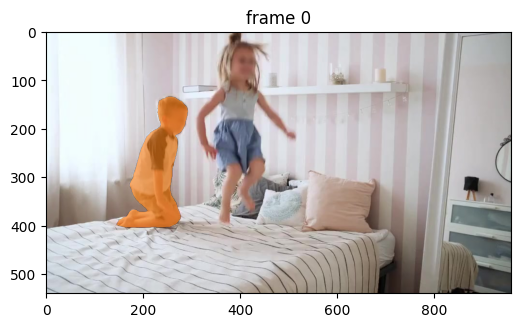

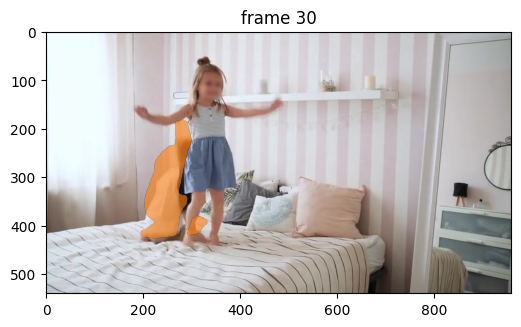

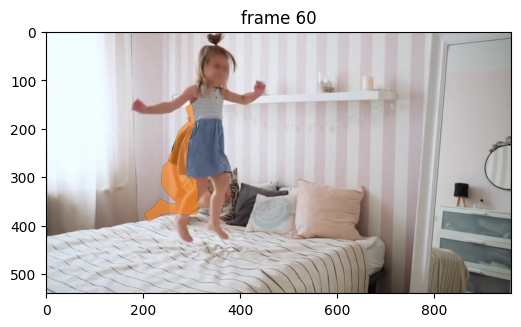

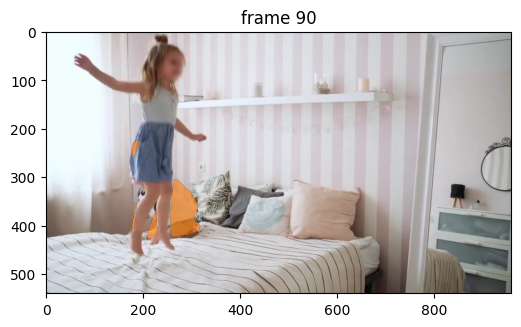

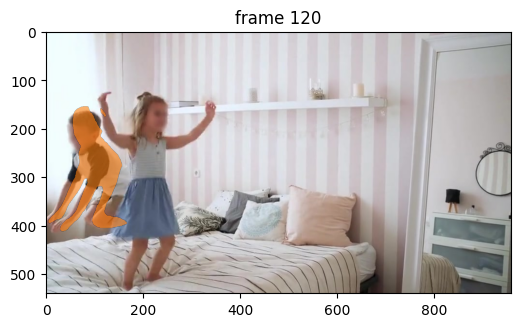

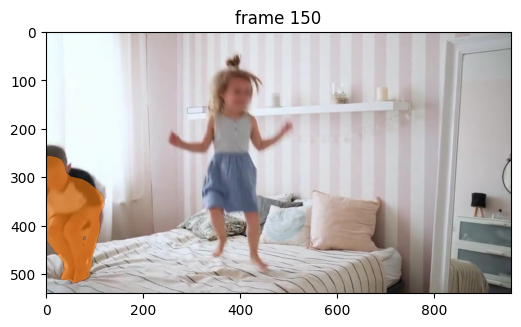

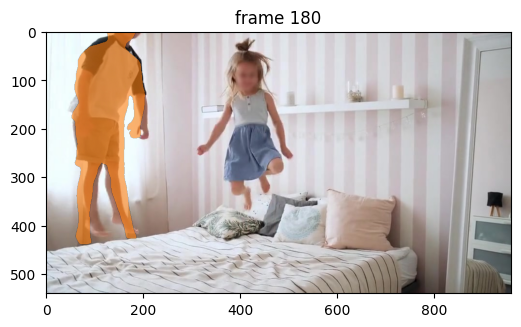

In [40]:
# run propagation throughout the video and collect the results in a dict
video_segments = {}  # video_segments contains the per-frame segmentation results
for out_frame_idx, out_obj_ids, out_mask_logits in predictor.propagate_in_video(inference_state):
    video_segments[out_frame_idx] = {
        out_obj_id: (out_mask_logits[i] > 0.0).cpu().numpy()
        for i, out_obj_id in enumerate(out_obj_ids)
    }

# render the segmentation results every few frames
vis_frame_stride = 30
plt.close("all")
for out_frame_idx in range(0, len(frame_names), vis_frame_stride):
    plt.figure(figsize=(6, 4))
    plt.title(f"frame {out_frame_idx}")
    plt.imshow(Image.open(os.path.join(video_dir, frame_names[out_frame_idx])))
    for out_obj_id, out_mask in video_segments[out_frame_idx].items():
        show_mask(out_mask, plt.gca(), obj_id=out_obj_id)

The segments now look good on all frames.

### Example 2: Segment an object using box prompt

Note: if you have run any previous tracking using this `inference_state`, please reset it first via `reset_state`.

In [41]:
predictor.reset_state(inference_state)

In addition to using clicks as inputs, SAM 2 also supports segmenting and tracking objects in a video via **bounding boxes**.

In the example below, we segment the child on the right using a **box prompt** of (x_min, y_min, x_max, y_max) = (300, 0, 500, 400) on frame 0 as input into the `add_new_points_or_box` API.

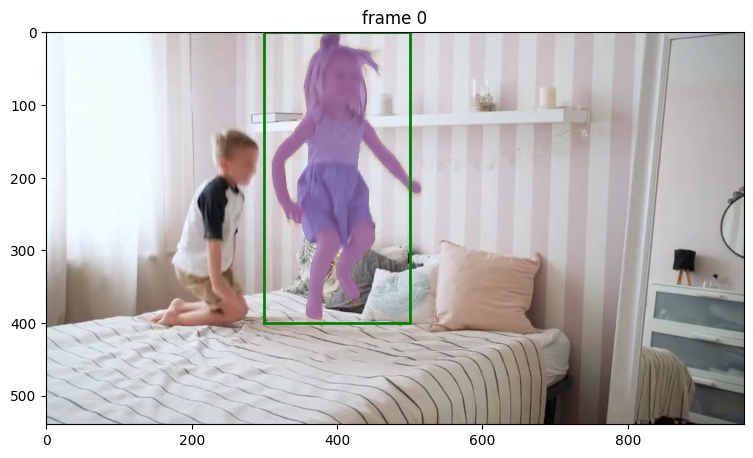

In [42]:
ann_frame_idx = 0  # the frame index we interact with
ann_obj_id = 4  # give a unique id to each object we interact with (it can be any integers)

# Let's add a box at (x_min, y_min, x_max, y_max) = (300, 0, 500, 400) to get started
box = np.array([300, 0, 500, 400], dtype=np.float32)
_, out_obj_ids, out_mask_logits = predictor.add_new_points_or_box(
    inference_state=inference_state,
    frame_idx=ann_frame_idx,
    obj_id=ann_obj_id,
    box=box,
)

# show the results on the current (interacted) frame
plt.figure(figsize=(9, 6))
plt.title(f"frame {ann_frame_idx}")
plt.imshow(Image.open(os.path.join(video_dir, frame_names[ann_frame_idx])))
show_box(box, plt.gca())
show_mask((out_mask_logits[0] > 0.0).cpu().numpy(), plt.gca(), obj_id=out_obj_ids[0])

Here, SAM 2 gets a pretty good segmentation mask of the entire child, even though the input bounding box is not perfectly tight around the object.

Similar to the previous example, if the returned mask from is not perfect when using a box prompt, we can also further **refine** the output using positive or negative clicks. To illustrate this, here we make a **positive click** at (x, y) = (460, 60) with label `1` to expand the segment around the child's hair.

Note: to refine the segmentation mask from a box prompt, we need to send **both the original box input and all subsequent refinement clicks and their labels** when calling `add_new_points_or_box`.

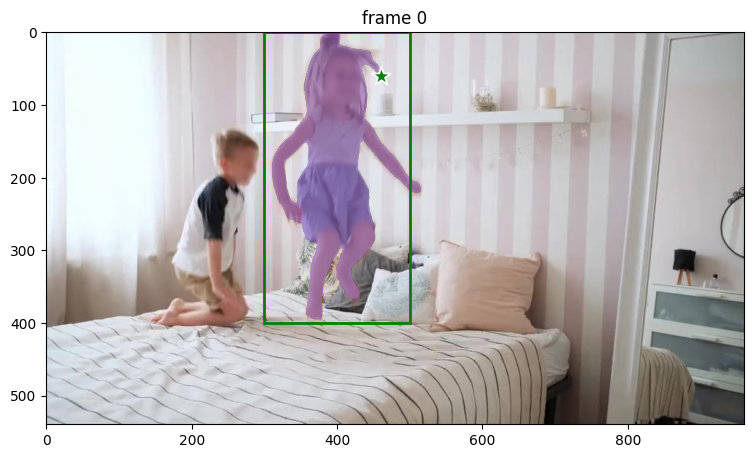

In [43]:
ann_frame_idx = 0  # the frame index we interact with
ann_obj_id = 4  # give a unique id to each object we interact with (it can be any integers)

# Let's add a positive click at (x, y) = (460, 60) to refine the mask
points = np.array([[460, 60]], dtype=np.float32)
# for labels, `1` means positive click and `0` means negative click
labels = np.array([1], np.int32)
# note that we also need to send the original box input along with
# the new refinement click together into `add_new_points_or_box`
box = np.array([300, 0, 500, 400], dtype=np.float32)
_, out_obj_ids, out_mask_logits = predictor.add_new_points_or_box(
    inference_state=inference_state,
    frame_idx=ann_frame_idx,
    obj_id=ann_obj_id,
    points=points,
    labels=labels,
    box=box,
)

# show the results on the current (interacted) frame
plt.figure(figsize=(9, 6))
plt.title(f"frame {ann_frame_idx}")
plt.imshow(Image.open(os.path.join(video_dir, frame_names[ann_frame_idx])))
show_box(box, plt.gca())
show_points(points, labels, plt.gca())
show_mask((out_mask_logits[0] > 0.0).cpu().numpy(), plt.gca(), obj_id=out_obj_ids[0])

Then, to get the masklet throughout the entire video, we propagate the prompts using the `propagate_in_video` API.

propagate in video:   2%|▏         | 3/200 [00:00<00:10, 19.23it/s]

Skipping frame 1 due to low masked MAD (0.00)
Skipping frame 2 due to low masked MAD (0.00)


propagate in video:   4%|▎         | 7/200 [00:01<00:28,  6.74it/s]

Skipping frame 4 due to low masked MAD (0.00)
Skipping frame 5 due to low masked MAD (0.00)
Skipping frame 6 due to low masked MAD (0.00)


propagate in video:   4%|▍         | 9/200 [00:01<00:43,  4.42it/s]

Skipping frame 8 due to low masked MAD (0.00)
Skipping frame 9 due to low masked MAD (0.00)


propagate in video:   6%|▋         | 13/200 [00:02<00:38,  4.81it/s]

Skipping frame 11 due to low masked MAD (0.00)
Skipping frame 12 due to low masked MAD (0.00)
Skipping frame 13 due to low masked MAD (0.00)


propagate in video:   8%|▊         | 17/200 [00:03<00:36,  4.96it/s]

Skipping frame 15 due to low masked MAD (0.00)
Skipping frame 16 due to low masked MAD (0.00)


propagate in video:  10%|█         | 20/200 [00:04<00:38,  4.72it/s]

Skipping frame 18 due to low masked MAD (0.00)
Skipping frame 19 due to low masked MAD (0.00)
Skipping frame 20 due to low masked MAD (0.00)


propagate in video:  12%|█▏        | 24/200 [00:05<00:35,  4.90it/s]

Skipping frame 22 due to low masked MAD (0.00)
Skipping frame 23 due to low masked MAD (0.00)
Skipping frame 24 due to low masked MAD (0.00)


propagate in video:  14%|█▍        | 28/200 [00:05<00:23,  7.33it/s]

Skipping frame 25 due to low masked MAD (0.00)
Skipping frame 26 due to low masked MAD (0.00)
Skipping frame 27 due to low masked MAD (0.00)


propagate in video:  16%|█▌        | 32/200 [00:06<00:28,  5.98it/s]

Skipping frame 29 due to low masked MAD (0.00)
Skipping frame 30 due to low masked MAD (0.00)
Avg FPS last 30 frames: 4.77
Skipping frame 31 due to low masked MAD (0.00)


propagate in video:  17%|█▋        | 34/200 [00:06<00:23,  7.16it/s]

Skipping frame 32 due to low masked MAD (0.00)
Skipping frame 33 due to low masked MAD (0.00)
Skipping frame 34 due to low masked MAD (0.00)


propagate in video:  19%|█▉        | 38/200 [00:06<00:17,  9.35it/s]

Skipping frame 35 due to low masked MAD (0.00)
Skipping frame 36 due to low masked MAD (0.00)
Skipping frame 37 due to low masked MAD (0.00)


propagate in video:  20%|██        | 40/200 [00:06<00:15, 10.21it/s]

Skipping frame 38 due to low masked MAD (0.00)
Skipping frame 39 due to low masked MAD (0.00)
Skipping frame 40 due to low masked MAD (0.00)


propagate in video:  22%|██▏       | 44/200 [00:07<00:22,  6.82it/s]

Skipping frame 42 due to low masked MAD (0.00)
Skipping frame 43 due to low masked MAD (0.00)
Skipping frame 44 due to low masked MAD (0.00)


propagate in video:  24%|██▍       | 48/200 [00:08<00:16,  8.97it/s]

Skipping frame 45 due to low masked MAD (0.00)
Skipping frame 46 due to low masked MAD (0.00)
Skipping frame 47 due to low masked MAD (0.00)


propagate in video:  25%|██▌       | 50/200 [00:08<00:14, 10.11it/s]

Skipping frame 48 due to low masked MAD (0.00)
Skipping frame 49 due to low masked MAD (0.00)
Skipping frame 50 due to low masked MAD (0.00)


propagate in video:  27%|██▋       | 54/200 [00:08<00:12, 11.26it/s]

Skipping frame 51 due to low masked MAD (0.00)
Skipping frame 52 due to low masked MAD (0.00)
Skipping frame 53 due to low masked MAD (0.00)


propagate in video:  28%|██▊       | 56/200 [00:08<00:12, 11.62it/s]

Skipping frame 54 due to low masked MAD (0.00)
Skipping frame 55 due to low masked MAD (0.00)
Skipping frame 56 due to low masked MAD (0.00)


propagate in video:  30%|███       | 60/200 [00:09<00:11, 12.24it/s]

Skipping frame 57 due to low masked MAD (0.00)
Skipping frame 58 due to low masked MAD (0.00)
Skipping frame 59 due to low masked MAD (0.00)


propagate in video:  31%|███       | 62/200 [00:09<00:11, 12.41it/s]

Skipping frame 60 due to low masked MAD (0.00)
Avg FPS last 30 frames: 10.44
Skipping frame 61 due to low masked MAD (0.00)
Skipping frame 62 due to low masked MAD (0.00)


propagate in video:  33%|███▎      | 66/200 [00:10<00:18,  7.08it/s]

Skipping frame 64 due to low masked MAD (0.00)
Skipping frame 65 due to low masked MAD (0.00)
Skipping frame 66 due to low masked MAD (0.00)


propagate in video:  35%|███▌      | 70/200 [00:10<00:14,  9.13it/s]

Skipping frame 67 due to low masked MAD (0.00)
Skipping frame 68 due to low masked MAD (0.00)
Skipping frame 69 due to low masked MAD (0.00)


propagate in video:  37%|███▋      | 74/200 [00:11<00:19,  6.52it/s]

Skipping frame 71 due to low masked MAD (0.00)
Skipping frame 72 due to low masked MAD (0.00)
Skipping frame 73 due to low masked MAD (0.00)


propagate in video:  38%|███▊      | 76/200 [00:11<00:16,  7.66it/s]

Skipping frame 74 due to low masked MAD (0.00)
Skipping frame 75 due to low masked MAD (0.00)


propagate in video:  40%|████      | 80/200 [00:12<00:19,  6.16it/s]

Skipping frame 77 due to low masked MAD (0.00)
Skipping frame 78 due to low masked MAD (0.00)
Skipping frame 79 due to low masked MAD (0.00)


propagate in video:  41%|████      | 82/200 [00:12<00:16,  7.28it/s]

Skipping frame 80 due to low masked MAD (0.00)
Skipping frame 81 due to low masked MAD (0.00)


propagate in video:  43%|████▎     | 86/200 [00:13<00:18,  6.00it/s]

Skipping frame 83 due to low masked MAD (0.00)
Skipping frame 84 due to low masked MAD (0.00)
Skipping frame 85 due to low masked MAD (0.00)


propagate in video:  44%|████▍     | 88/200 [00:13<00:15,  7.17it/s]

Skipping frame 86 due to low masked MAD (0.00)
Skipping frame 87 due to low masked MAD (0.00)
Skipping frame 88 due to low masked MAD (0.00)


propagate in video:  46%|████▌     | 92/200 [00:14<00:18,  5.92it/s]

Skipping frame 90 due to low masked MAD (0.00)
Avg FPS last 30 frames: 5.77
Skipping frame 91 due to low masked MAD (0.00)
Skipping frame 92 due to low masked MAD (0.00)


propagate in video:  48%|████▊     | 96/200 [00:14<00:12,  8.15it/s]

Skipping frame 93 due to low masked MAD (0.00)
Skipping frame 94 due to low masked MAD (0.00)
Skipping frame 95 due to low masked MAD (0.00)


propagate in video:  49%|████▉     | 98/200 [00:14<00:11,  9.16it/s]

Skipping frame 96 due to low masked MAD (0.00)
Skipping frame 97 due to low masked MAD (0.00)


propagate in video:  51%|█████     | 102/200 [00:15<00:15,  6.51it/s]

Skipping frame 99 due to low masked MAD (0.00)
Skipping frame 100 due to low masked MAD (0.00)
Skipping frame 101 due to low masked MAD (0.00)


propagate in video:  52%|█████▏    | 104/200 [00:15<00:12,  7.58it/s]

Skipping frame 102 due to low masked MAD (0.00)
Skipping frame 103 due to low masked MAD (0.00)
Skipping frame 104 due to low masked MAD (0.00)


propagate in video:  53%|█████▎    | 106/200 [00:16<00:10,  8.59it/s]

Skipping frame 105 due to low masked MAD (0.00)


propagate in video:  55%|█████▌    | 110/200 [00:16<00:13,  6.46it/s]

Skipping frame 107 due to low masked MAD (0.00)
Skipping frame 108 due to low masked MAD (0.00)
Skipping frame 109 due to low masked MAD (0.00)
Skipping frame 110 due to low masked MAD (0.00)


propagate in video:  57%|█████▋    | 114/200 [00:17<00:15,  5.73it/s]

Skipping frame 112 due to low masked MAD (0.00)
Skipping frame 113 due to low masked MAD (0.00)
Skipping frame 114 due to low masked MAD (0.00)


propagate in video:  59%|█████▉    | 118/200 [00:18<00:15,  5.42it/s]

Skipping frame 116 due to low masked MAD (0.00)
Skipping frame 117 due to low masked MAD (0.00)


propagate in video:  60%|██████    | 121/200 [00:19<00:16,  4.91it/s]

Skipping frame 119 due to low masked MAD (0.00)
Skipping frame 120 due to low masked MAD (0.00)
Avg FPS last 30 frames: 5.79
Skipping frame 121 due to low masked MAD (0.00)


propagate in video:  62%|██████▏   | 123/200 [00:20<00:20,  3.85it/s]

Skipping frame 123 due to low masked MAD (0.00)


propagate in video:  62%|██████▎   | 125/200 [00:21<00:21,  3.41it/s]

Skipping frame 125 due to low masked MAD (0.00)


propagate in video:  64%|██████▍   | 129/200 [00:21<00:17,  4.11it/s]

Skipping frame 127 due to low masked MAD (0.00)
Skipping frame 128 due to low masked MAD (0.00)


propagate in video:  66%|██████▌   | 132/200 [00:22<00:15,  4.26it/s]

Skipping frame 130 due to low masked MAD (0.00)
Skipping frame 131 due to low masked MAD (0.00)


propagate in video:  66%|██████▋   | 133/200 [00:23<00:21,  3.16it/s]

Skipping frame 133 due to low masked MAD (0.00)


propagate in video:  68%|██████▊   | 135/200 [00:24<00:21,  2.99it/s]

Skipping frame 135 due to low masked MAD (0.00)


propagate in video:  70%|██████▉   | 139/200 [00:24<00:15,  3.88it/s]

Skipping frame 137 due to low masked MAD (0.00)
Skipping frame 138 due to low masked MAD (0.00)


propagate in video:  70%|███████   | 140/200 [00:25<00:19,  3.02it/s]

Skipping frame 140 due to low masked MAD (0.00)


propagate in video:  71%|███████   | 142/200 [00:26<00:19,  2.91it/s]

Skipping frame 142 due to low masked MAD (0.00)


propagate in video:  72%|███████▎  | 145/200 [00:27<00:16,  3.29it/s]

Skipping frame 144 due to low masked MAD (0.00)


propagate in video:  74%|███████▍  | 148/200 [00:28<00:13,  3.76it/s]

Skipping frame 146 due to low masked MAD (0.00)
Skipping frame 147 due to low masked MAD (0.00)


propagate in video:  74%|███████▍  | 149/200 [00:28<00:17,  2.89it/s]

Skipping frame 149 due to low masked MAD (0.00)


propagate in video:  76%|███████▌  | 151/200 [00:29<00:17,  2.85it/s]

Avg FPS last 30 frames: 3.05
Skipping frame 151 due to low masked MAD (0.00)


propagate in video:  76%|███████▋  | 153/200 [00:30<00:16,  2.81it/s]

Skipping frame 153 due to low masked MAD (0.00)


propagate in video:  78%|███████▊  | 155/200 [00:30<00:16,  2.80it/s]

Skipping frame 155 due to low masked MAD (0.00)


propagate in video:  78%|███████▊  | 157/200 [00:31<00:15,  2.80it/s]

Skipping frame 157 due to low masked MAD (0.00)


propagate in video:  80%|███████▉  | 159/200 [00:32<00:14,  2.79it/s]

Skipping frame 159 due to low masked MAD (0.00)


propagate in video:  82%|████████▏ | 163/200 [00:33<00:10,  3.65it/s]

Skipping frame 161 due to low masked MAD (0.00)
Skipping frame 162 due to low masked MAD (0.00)


propagate in video:  82%|████████▏ | 164/200 [00:33<00:12,  2.92it/s]

Skipping frame 164 due to low masked MAD (0.00)


propagate in video:  83%|████████▎ | 166/200 [00:34<00:11,  2.86it/s]

Skipping frame 166 due to low masked MAD (0.00)


propagate in video:  84%|████████▍ | 168/200 [00:35<00:11,  2.82it/s]

Skipping frame 168 due to low masked MAD (0.00)


propagate in video:  86%|████████▌ | 172/200 [00:36<00:07,  3.69it/s]

Skipping frame 170 due to low masked MAD (0.00)
Skipping frame 171 due to low masked MAD (0.00)


propagate in video:  86%|████████▋ | 173/200 [00:36<00:09,  2.94it/s]

Skipping frame 173 due to low masked MAD (0.00)


propagate in video:  88%|████████▊ | 177/200 [00:37<00:05,  3.85it/s]

Skipping frame 175 due to low masked MAD (0.00)
Skipping frame 176 due to low masked MAD (0.00)


propagate in video:  90%|█████████ | 180/200 [00:38<00:04,  4.05it/s]

Skipping frame 178 due to low masked MAD (0.00)
Skipping frame 179 due to low masked MAD (0.00)
Skipping frame 180 due to low masked MAD (0.00)
Avg FPS last 30 frames: 3.26


propagate in video:  91%|█████████ | 182/200 [00:38<00:03,  5.27it/s]

Skipping frame 181 due to low masked MAD (0.00)


propagate in video:  92%|█████████▏| 183/200 [00:39<00:04,  3.61it/s]

Skipping frame 183 due to low masked MAD (0.00)


propagate in video:  92%|█████████▎| 185/200 [00:40<00:04,  3.23it/s]

Skipping frame 185 due to low masked MAD (0.00)


propagate in video:  94%|█████████▎| 187/200 [00:40<00:04,  3.05it/s]

Skipping frame 187 due to low masked MAD (0.00)


propagate in video:  96%|█████████▌| 191/200 [00:41<00:02,  3.89it/s]

Skipping frame 189 due to low masked MAD (0.00)
Skipping frame 190 due to low masked MAD (0.00)


propagate in video:  96%|█████████▌| 192/200 [00:42<00:02,  3.04it/s]

Skipping frame 192 due to low masked MAD (0.00)


propagate in video:  97%|█████████▋| 194/200 [00:43<00:02,  2.92it/s]

Skipping frame 194 due to low masked MAD (0.00)


propagate in video:  99%|█████████▉| 198/200 [00:43<00:00,  3.79it/s]

Skipping frame 196 due to low masked MAD (0.00)
Skipping frame 197 due to low masked MAD (0.00)


propagate in video: 100%|██████████| 200/200 [00:44<00:00,  4.47it/s]


Skipping frame 199 due to low masked MAD (0.00)
Skipped 148 frames due to low MAD.


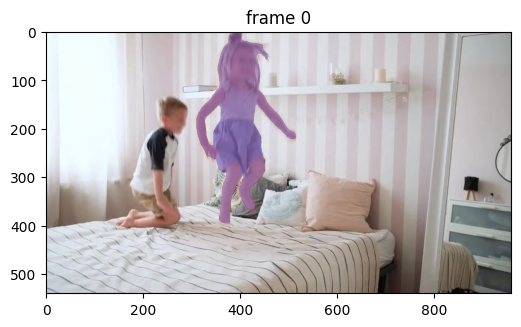

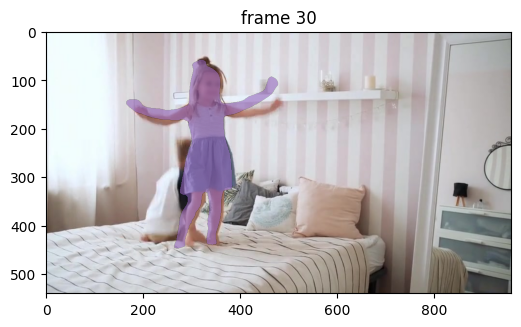

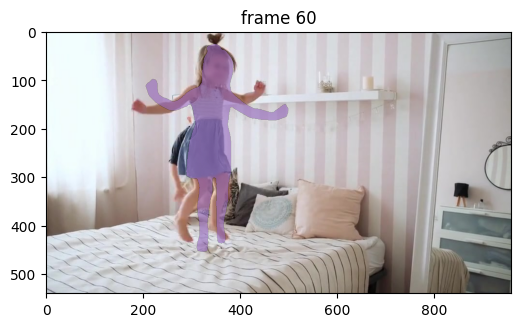

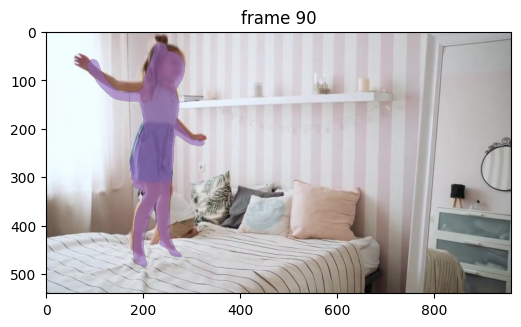

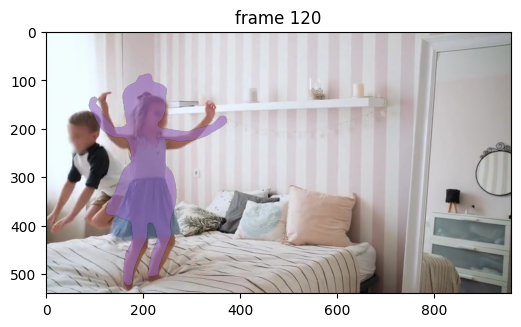

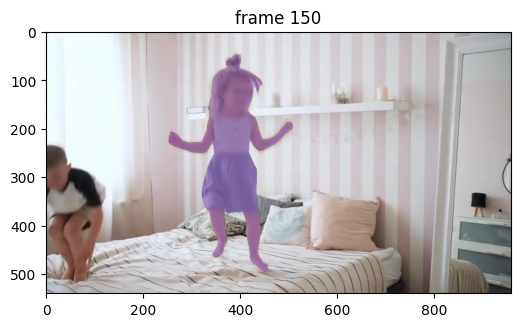

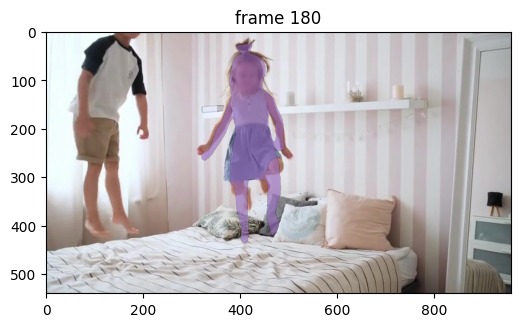

In [44]:
# run propagation throughout the video and collect the results in a dict
video_segments = {}  # video_segments contains the per-frame segmentation results
for out_frame_idx, out_obj_ids, out_mask_logits in predictor.propagate_in_video(inference_state):
    video_segments[out_frame_idx] = {
        out_obj_id: (out_mask_logits[i] > 0.0).cpu().numpy()
        for i, out_obj_id in enumerate(out_obj_ids)
    }

# render the segmentation results every few frames
vis_frame_stride = 30
plt.close("all")
for out_frame_idx in range(0, len(frame_names), vis_frame_stride):
    plt.figure(figsize=(6, 4))
    plt.title(f"frame {out_frame_idx}")
    plt.imshow(Image.open(os.path.join(video_dir, frame_names[out_frame_idx])))
    for out_obj_id, out_mask in video_segments[out_frame_idx].items():
        show_mask(out_mask, plt.gca(), obj_id=out_obj_id)

Note that in addition to clicks or boxes, SAM 2 also supports directly using a **mask prompt** as input via the `add_new_mask` method in the `SAM2VideoPredictor` class. This can be helpful in e.g. semi-supervised VOS evaluations (see [tools/vos_inference.py](https://github.com/facebookresearch/sam2/blob/main/tools/vos_inference.py) for an example).

### Example 3: Segment multiple objects simultaneously

Note: if you have run any previous tracking using this `inference_state`, please reset it first via `reset_state`.

In [45]:
predictor.reset_state(inference_state)

#### Step 1: Add two objects on a frame

SAM 2 can also segment and track two or more objects at the same time. One way, of course, is to do them one by one. However, it would be more efficient to batch them together (e.g. so that we can share the image features between objects to reduce computation costs).

This time, let's focus on object parts and segment **the shirts of both childen** in this video. Here we add prompts for these two objects and assign each of them a unique object id.

In [46]:
prompts = {}  # hold all the clicks we add for visualization

Add the first object (the left child's shirt) with a **positive click** at (x, y) = (200, 300) on frame 0.

We assign it to object id `2` (it can be arbitrary integers, and only needs to be unique for each object to track), which is passed to the `add_new_points_or_box` API to distinguish the object we are clicking upon.

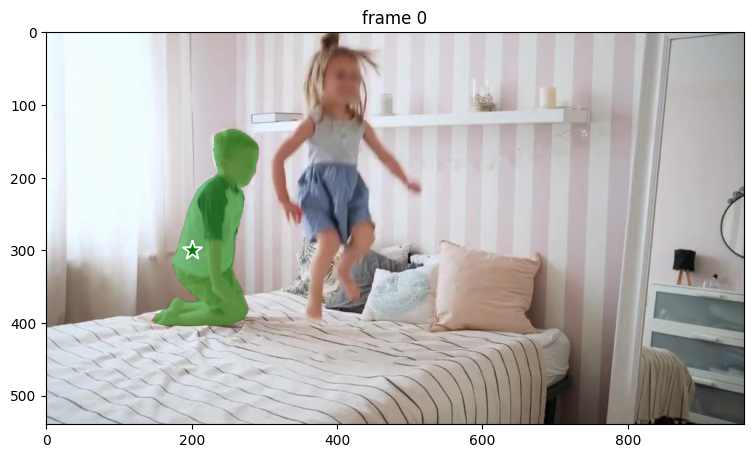

In [47]:
ann_frame_idx = 0  # the frame index we interact with
ann_obj_id = 2  # give a unique id to each object we interact with (it can be any integers)

# Let's add a positive click at (x, y) = (200, 300) to get started on the first object
points = np.array([[200, 300]], dtype=np.float32)
# for labels, `1` means positive click and `0` means negative click
labels = np.array([1], np.int32)
prompts[ann_obj_id] = points, labels
_, out_obj_ids, out_mask_logits = predictor.add_new_points_or_box(
    inference_state=inference_state,
    frame_idx=ann_frame_idx,
    obj_id=ann_obj_id,
    points=points,
    labels=labels,
)

# show the results on the current (interacted) frame
plt.figure(figsize=(9, 6))
plt.title(f"frame {ann_frame_idx}")
plt.imshow(Image.open(os.path.join(video_dir, frame_names[ann_frame_idx])))
show_points(points, labels, plt.gca())
for i, out_obj_id in enumerate(out_obj_ids):
    show_points(*prompts[out_obj_id], plt.gca())
    show_mask((out_mask_logits[i] > 0.0).cpu().numpy(), plt.gca(), obj_id=out_obj_id)

Hmm, this time we just want to select the child's shirt, but the model predicts the mask for the entire child. Let's refine the prediction with a **negative click** at (x, y) = (275, 175).

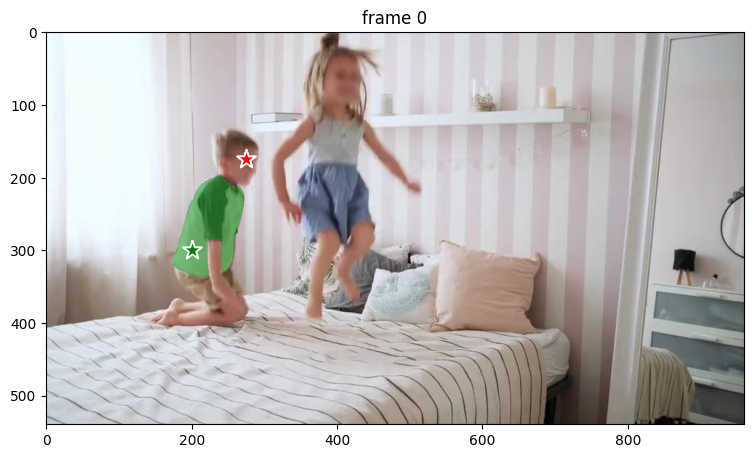

In [48]:
# add the first object
ann_frame_idx = 0  # the frame index we interact with
ann_obj_id = 2  # give a unique id to each object we interact with (it can be any integers)

# Let's add a 2nd negative click at (x, y) = (275, 175) to refine the first object
# sending all clicks (and their labels) to `add_new_points_or_box`
points = np.array([[200, 300], [275, 175]], dtype=np.float32)
# for labels, `1` means positive click and `0` means negative click
labels = np.array([1, 0], np.int32)
prompts[ann_obj_id] = points, labels
_, out_obj_ids, out_mask_logits = predictor.add_new_points_or_box(
    inference_state=inference_state,
    frame_idx=ann_frame_idx,
    obj_id=ann_obj_id,
    points=points,
    labels=labels,
)

# show the results on the current (interacted) frame
plt.figure(figsize=(9, 6))
plt.title(f"frame {ann_frame_idx}")
plt.imshow(Image.open(os.path.join(video_dir, frame_names[ann_frame_idx])))
show_points(points, labels, plt.gca())
for i, out_obj_id in enumerate(out_obj_ids):
    show_points(*prompts[out_obj_id], plt.gca())
    show_mask((out_mask_logits[i] > 0.0).cpu().numpy(), plt.gca(), obj_id=out_obj_id)

After the 2nd negative click, now we get the left child's shirt as our first object.

Let's move on to the second object (the right child's shirt) with a positive click at (x, y) = (400, 150) on frame 0. Here we assign object id `3` to this second object (it can be arbitrary integers, and only needs to be unique for each object to track).

Note: when there are multiple objects, the `add_new_points_or_box` API will return a list of masks for each object.

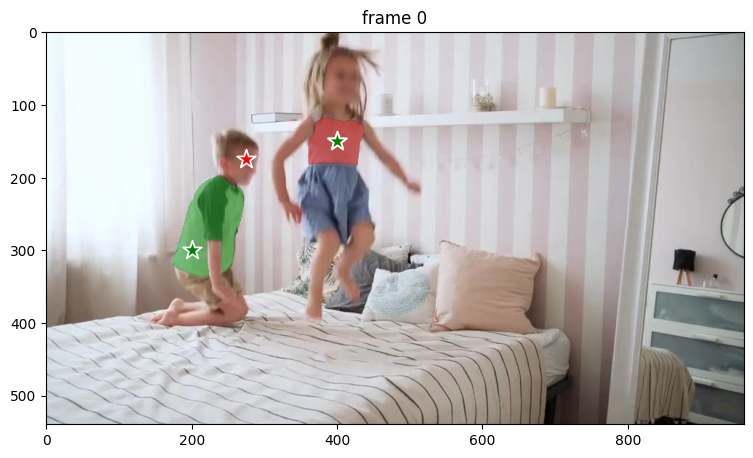

In [49]:
ann_frame_idx = 0  # the frame index we interact with
ann_obj_id = 3  # give a unique id to each object we interact with (it can be any integers)

# Let's now move on to the second object we want to track (giving it object id `3`)
# with a positive click at (x, y) = (400, 150)
points = np.array([[400, 150]], dtype=np.float32)
# for labels, `1` means positive click and `0` means negative click
labels = np.array([1], np.int32)
prompts[ann_obj_id] = points, labels

# `add_new_points_or_box` returns masks for all objects added so far on this interacted frame
_, out_obj_ids, out_mask_logits = predictor.add_new_points_or_box(
    inference_state=inference_state,
    frame_idx=ann_frame_idx,
    obj_id=ann_obj_id,
    points=points,
    labels=labels,
)

# show the results on the current (interacted) frame on all objects
plt.figure(figsize=(9, 6))
plt.title(f"frame {ann_frame_idx}")
plt.imshow(Image.open(os.path.join(video_dir, frame_names[ann_frame_idx])))
show_points(points, labels, plt.gca())
for i, out_obj_id in enumerate(out_obj_ids):
    show_points(*prompts[out_obj_id], plt.gca())
    show_mask((out_mask_logits[i] > 0.0).cpu().numpy(), plt.gca(), obj_id=out_obj_id)

This time the model predicts the mask of the shirt we want to track in just one click. Nice!

#### Step 2: Propagate the prompts to get masklets across the video

Now, we propagate the prompts for both objects to get their masklets throughout the video.

Note: when there are multiple objects, the `propagate_in_video` API will return a list of masks for each object.

propagate in video:   1%|          | 2/200 [00:00<00:10, 18.23it/s]

Skipping frame 1 due to low masked MAD (0.00)
Skipping frame 2 due to low masked MAD (0.00)


propagate in video:   2%|▎         | 5/200 [00:01<00:41,  4.68it/s]

Skipping frame 4 due to low masked MAD (0.00)
Skipping frame 5 due to low masked MAD (0.00)
Skipping frame 6 due to low masked MAD (0.00)


propagate in video:   5%|▌         | 10/200 [00:02<00:39,  4.77it/s]

Skipping frame 8 due to low masked MAD (0.00)
Skipping frame 9 due to low masked MAD (0.00)


propagate in video:   6%|▋         | 13/200 [00:03<00:44,  4.25it/s]

Skipping frame 11 due to low masked MAD (0.00)
Skipping frame 12 due to low masked MAD (0.00)
Skipping frame 13 due to low masked MAD (0.00)


propagate in video:   8%|▊         | 17/200 [00:04<00:41,  4.39it/s]

Skipping frame 15 due to low masked MAD (0.00)
Skipping frame 16 due to low masked MAD (0.00)


propagate in video:  10%|█         | 20/200 [00:04<00:42,  4.19it/s]

Skipping frame 18 due to low masked MAD (0.00)
Skipping frame 19 due to low masked MAD (0.00)
Skipping frame 20 due to low masked MAD (0.00)


propagate in video:  12%|█▏        | 24/200 [00:05<00:39,  4.40it/s]

Skipping frame 22 due to low masked MAD (0.00)
Skipping frame 23 due to low masked MAD (0.00)
Skipping frame 24 due to low masked MAD (0.00)


propagate in video:  14%|█▍        | 28/200 [00:06<00:25,  6.66it/s]

Skipping frame 25 due to low masked MAD (0.00)
Skipping frame 26 due to low masked MAD (0.00)
Skipping frame 27 due to low masked MAD (0.00)


propagate in video:  16%|█▌        | 32/200 [00:07<00:30,  5.46it/s]

Skipping frame 29 due to low masked MAD (0.00)
Skipping frame 30 due to low masked MAD (0.00)
Avg FPS last 30 frames: 4.22
Skipping frame 31 due to low masked MAD (0.00)


propagate in video:  17%|█▋        | 34/200 [00:07<00:26,  6.23it/s]

Skipping frame 32 due to low masked MAD (0.00)
Skipping frame 33 due to low masked MAD (0.00)


propagate in video:  18%|█▊        | 36/200 [00:07<00:24,  6.75it/s]

Skipping frame 34 due to low masked MAD (0.00)
Skipping frame 35 due to low masked MAD (0.00)


propagate in video:  19%|█▉        | 38/200 [00:07<00:22,  7.20it/s]

Skipping frame 36 due to low masked MAD (0.00)
Skipping frame 37 due to low masked MAD (0.00)


propagate in video:  20%|██        | 40/200 [00:08<00:19,  8.00it/s]

Skipping frame 38 due to low masked MAD (0.00)
Skipping frame 39 due to low masked MAD (0.00)


propagate in video:  20%|██        | 41/200 [00:08<00:19,  8.07it/s]

Skipping frame 40 due to low masked MAD (0.00)


propagate in video:  22%|██▏       | 43/200 [00:09<00:41,  3.79it/s]

Skipping frame 42 due to low masked MAD (0.00)
Skipping frame 43 due to low masked MAD (0.00)
Skipping frame 44 due to low masked MAD (0.00)


propagate in video:  24%|██▎       | 47/200 [00:09<00:22,  6.74it/s]

Skipping frame 45 due to low masked MAD (0.00)
Skipping frame 46 due to low masked MAD (0.00)
Skipping frame 47 due to low masked MAD (0.00)


propagate in video:  24%|██▍       | 49/200 [00:09<00:19,  7.71it/s]

Skipping frame 48 due to low masked MAD (0.00)
Skipping frame 49 due to low masked MAD (0.00)
Skipping frame 50 due to low masked MAD (0.00)


propagate in video:  26%|██▌       | 52/200 [00:10<00:17,  8.64it/s]

Skipping frame 51 due to low masked MAD (0.00)
Skipping frame 52 due to low masked MAD (0.00)
Skipping frame 53 due to low masked MAD (0.00)


propagate in video:  28%|██▊       | 56/200 [00:10<00:15,  9.49it/s]

Skipping frame 54 due to low masked MAD (0.00)
Skipping frame 55 due to low masked MAD (0.00)
Skipping frame 56 due to low masked MAD (0.00)


propagate in video:  30%|███       | 60/200 [00:10<00:13, 10.54it/s]

Skipping frame 57 due to low masked MAD (0.00)
Skipping frame 58 due to low masked MAD (0.00)
Skipping frame 59 due to low masked MAD (0.00)


propagate in video:  31%|███       | 62/200 [00:10<00:12, 10.75it/s]

Skipping frame 60 due to low masked MAD (0.00)
Avg FPS last 30 frames: 7.89
Skipping frame 61 due to low masked MAD (0.00)
Skipping frame 62 due to low masked MAD (0.00)


propagate in video:  33%|███▎      | 66/200 [00:11<00:19,  6.71it/s]

Skipping frame 64 due to low masked MAD (0.00)
Skipping frame 65 due to low masked MAD (0.00)
Skipping frame 66 due to low masked MAD (0.00)


propagate in video:  35%|███▌      | 70/200 [00:12<00:14,  8.88it/s]

Skipping frame 67 due to low masked MAD (0.00)
Skipping frame 68 due to low masked MAD (0.00)
Skipping frame 69 due to low masked MAD (0.00)


propagate in video:  36%|███▋      | 73/200 [00:13<00:25,  5.07it/s]

Skipping frame 71 due to low masked MAD (0.00)
Skipping frame 72 due to low masked MAD (0.00)


propagate in video:  38%|███▊      | 75/200 [00:13<00:20,  6.17it/s]

Skipping frame 73 due to low masked MAD (0.00)
Skipping frame 74 due to low masked MAD (0.00)


propagate in video:  39%|███▉      | 78/200 [00:14<00:27,  4.40it/s]

Skipping frame 76 due to low masked MAD (0.00)
Skipping frame 77 due to low masked MAD (0.00)
Skipping frame 78 due to low masked MAD (0.00)


propagate in video:  40%|████      | 80/200 [00:14<00:20,  5.89it/s]

Skipping frame 79 due to low masked MAD (0.00)
Skipping frame 80 due to low masked MAD (0.00)
Skipping frame 81 due to low masked MAD (0.00)


propagate in video:  42%|████▏     | 84/200 [00:15<00:27,  4.23it/s]

Skipping frame 83 due to low masked MAD (0.00)
Skipping frame 84 due to low masked MAD (0.00)
Skipping frame 85 due to low masked MAD (0.00)


propagate in video:  44%|████▍     | 88/200 [00:16<00:16,  6.77it/s]

Skipping frame 86 due to low masked MAD (0.00)
Skipping frame 87 due to low masked MAD (0.00)


propagate in video:  46%|████▌     | 91/200 [00:17<00:22,  4.89it/s]

Skipping frame 89 due to low masked MAD (0.00)
Skipping frame 90 due to low masked MAD (0.00)
Avg FPS last 30 frames: 4.87
Skipping frame 91 due to low masked MAD (0.00)


propagate in video:  48%|████▊     | 95/200 [00:17<00:14,  7.26it/s]

Skipping frame 92 due to low masked MAD (0.00)
Skipping frame 93 due to low masked MAD (0.00)
Skipping frame 94 due to low masked MAD (0.00)


propagate in video:  49%|████▉     | 98/200 [00:18<00:18,  5.46it/s]

Skipping frame 96 due to low masked MAD (0.00)
Skipping frame 97 due to low masked MAD (0.00)
Skipping frame 98 due to low masked MAD (0.00)


propagate in video:  50%|█████     | 100/200 [00:18<00:14,  6.84it/s]

Skipping frame 99 due to low masked MAD (0.00)


propagate in video:  52%|█████▏    | 104/200 [00:19<00:16,  5.82it/s]

Skipping frame 101 due to low masked MAD (0.00)
Skipping frame 102 due to low masked MAD (0.00)
Skipping frame 103 due to low masked MAD (0.00)
Skipping frame 104 due to low masked MAD (0.00)


propagate in video:  54%|█████▍    | 108/200 [00:20<00:16,  5.53it/s]

Skipping frame 106 due to low masked MAD (0.00)
Skipping frame 107 due to low masked MAD (0.00)
Skipping frame 108 due to low masked MAD (0.00)


propagate in video:  56%|█████▌    | 112/200 [00:20<00:16,  5.37it/s]

Skipping frame 110 due to low masked MAD (0.00)
Skipping frame 111 due to low masked MAD (0.00)
Skipping frame 112 due to low masked MAD (0.00)


propagate in video:  57%|█████▋    | 114/200 [00:21<00:12,  6.63it/s]

Skipping frame 113 due to low masked MAD (0.00)


propagate in video:  58%|█████▊    | 116/200 [00:21<00:17,  4.67it/s]

Skipping frame 115 due to low masked MAD (0.00)
Skipping frame 116 due to low masked MAD (0.00)


propagate in video:  60%|██████    | 120/200 [00:22<00:16,  4.87it/s]

Skipping frame 118 due to low masked MAD (0.00)
Skipping frame 119 due to low masked MAD (0.00)


propagate in video:  60%|██████    | 121/200 [00:23<00:22,  3.51it/s]

Avg FPS last 30 frames: 4.74
Skipping frame 121 due to low masked MAD (0.00)


propagate in video:  62%|██████▏   | 123/200 [00:24<00:23,  3.21it/s]

Skipping frame 123 due to low masked MAD (0.00)


propagate in video:  62%|██████▎   | 125/200 [00:24<00:24,  3.06it/s]

Skipping frame 125 due to low masked MAD (0.00)


propagate in video:  64%|██████▍   | 129/200 [00:25<00:18,  3.93it/s]

Skipping frame 127 due to low masked MAD (0.00)
Skipping frame 128 due to low masked MAD (0.00)


propagate in video:  65%|██████▌   | 130/200 [00:26<00:22,  3.05it/s]

Skipping frame 130 due to low masked MAD (0.00)


propagate in video:  66%|██████▌   | 132/200 [00:27<00:22,  2.96it/s]

Skipping frame 132 due to low masked MAD (0.00)


propagate in video:  67%|██████▋   | 134/200 [00:27<00:23,  2.82it/s]

Skipping frame 134 due to low masked MAD (0.00)


propagate in video:  68%|██████▊   | 136/200 [00:28<00:23,  2.73it/s]

Skipping frame 136 due to low masked MAD (0.00)


propagate in video:  70%|███████   | 140/200 [00:29<00:17,  3.36it/s]

Skipping frame 138 due to low masked MAD (0.00)
Skipping frame 139 due to low masked MAD (0.00)


propagate in video:  71%|███████   | 142/200 [00:30<00:19,  3.00it/s]

Skipping frame 141 due to low masked MAD (0.00)


propagate in video:  72%|███████▏  | 143/200 [00:31<00:24,  2.33it/s]

Skipping frame 143 due to low masked MAD (0.00)


propagate in video:  74%|███████▎  | 147/200 [00:32<00:15,  3.44it/s]

Skipping frame 145 due to low masked MAD (0.00)
Skipping frame 146 due to low masked MAD (0.00)


propagate in video:  74%|███████▍  | 148/200 [00:32<00:19,  2.68it/s]

Skipping frame 148 due to low masked MAD (0.00)


propagate in video:  75%|███████▌  | 150/200 [00:33<00:18,  2.66it/s]

Skipping frame 150 due to low masked MAD (0.00)
Avg FPS last 30 frames: 2.87


propagate in video:  76%|███████▌  | 152/200 [00:34<00:18,  2.64it/s]

Skipping frame 152 due to low masked MAD (0.00)


propagate in video:  77%|███████▋  | 154/200 [00:35<00:17,  2.62it/s]

Skipping frame 154 due to low masked MAD (0.00)


propagate in video:  78%|███████▊  | 156/200 [00:36<00:16,  2.61it/s]

Skipping frame 156 due to low masked MAD (0.00)


propagate in video:  79%|███████▉  | 158/200 [00:36<00:16,  2.60it/s]

Skipping frame 158 due to low masked MAD (0.00)


propagate in video:  81%|████████  | 162/200 [00:37<00:11,  3.44it/s]

Skipping frame 160 due to low masked MAD (0.00)
Skipping frame 161 due to low masked MAD (0.00)


propagate in video:  82%|████████▎ | 165/200 [00:38<00:09,  3.75it/s]

Skipping frame 163 due to low masked MAD (0.00)
Skipping frame 164 due to low masked MAD (0.00)


propagate in video:  83%|████████▎ | 166/200 [00:39<00:11,  2.85it/s]

Skipping frame 166 due to low masked MAD (0.00)


propagate in video:  84%|████████▍ | 168/200 [00:40<00:11,  2.76it/s]

Skipping frame 168 due to low masked MAD (0.00)


propagate in video:  86%|████████▌ | 172/200 [00:41<00:07,  3.62it/s]

Skipping frame 170 due to low masked MAD (0.00)
Skipping frame 171 due to low masked MAD (0.00)


propagate in video:  86%|████████▋ | 173/200 [00:41<00:09,  2.82it/s]

Skipping frame 173 due to low masked MAD (0.00)


propagate in video:  88%|████████▊ | 177/200 [00:42<00:06,  3.71it/s]

Skipping frame 175 due to low masked MAD (0.00)
Skipping frame 176 due to low masked MAD (0.00)


propagate in video:  90%|█████████ | 180/200 [00:43<00:05,  3.93it/s]

Skipping frame 178 due to low masked MAD (0.00)
Skipping frame 179 due to low masked MAD (0.00)
Skipping frame 180 due to low masked MAD (0.00)
Avg FPS last 30 frames: 3.08


propagate in video:  91%|█████████ | 182/200 [00:43<00:03,  5.14it/s]

Skipping frame 181 due to low masked MAD (0.00)


propagate in video:  92%|█████████▏| 183/200 [00:44<00:04,  3.43it/s]

Skipping frame 183 due to low masked MAD (0.00)


propagate in video:  92%|█████████▎| 185/200 [00:45<00:04,  3.05it/s]

Skipping frame 185 due to low masked MAD (0.00)


propagate in video:  94%|█████████▎| 187/200 [00:45<00:04,  2.87it/s]

Skipping frame 187 due to low masked MAD (0.00)


propagate in video:  96%|█████████▌| 191/200 [00:46<00:02,  3.71it/s]

Skipping frame 189 due to low masked MAD (0.00)
Skipping frame 190 due to low masked MAD (0.00)


propagate in video:  96%|█████████▌| 192/200 [00:47<00:02,  2.88it/s]

Skipping frame 192 due to low masked MAD (0.00)


propagate in video:  97%|█████████▋| 194/200 [00:48<00:02,  2.77it/s]

Skipping frame 194 due to low masked MAD (0.00)


propagate in video:  99%|█████████▉| 198/200 [00:49<00:00,  3.57it/s]

Skipping frame 196 due to low masked MAD (0.00)
Skipping frame 197 due to low masked MAD (0.00)


propagate in video: 100%|██████████| 200/200 [00:50<00:00,  4.00it/s]


Skipping frame 199 due to low masked MAD (0.00)
Skipped 146 frames due to low MAD.


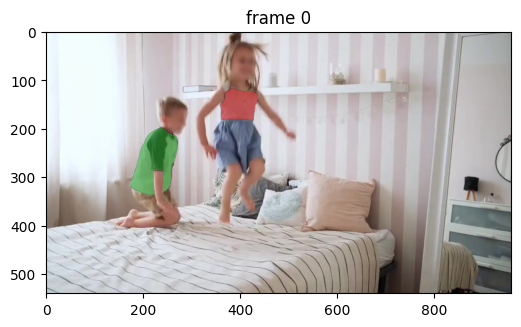

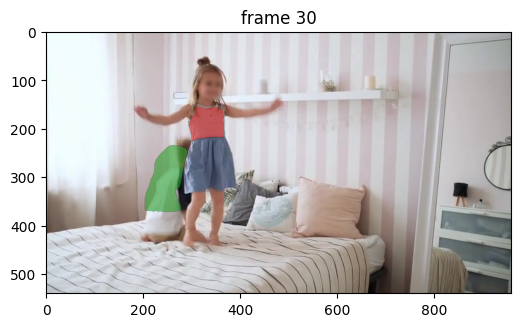

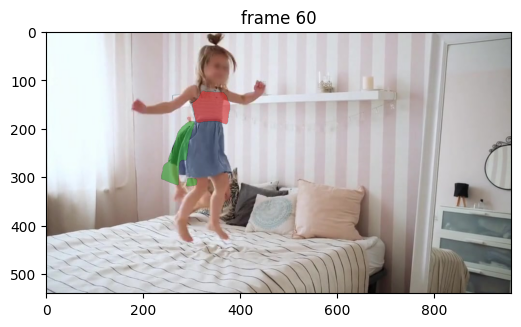

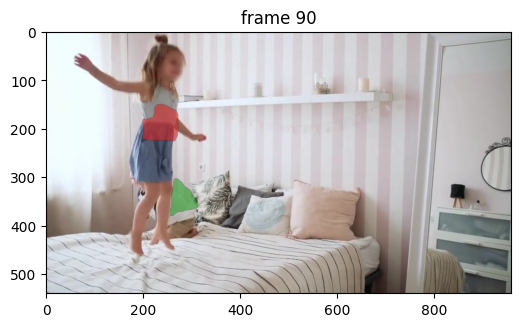

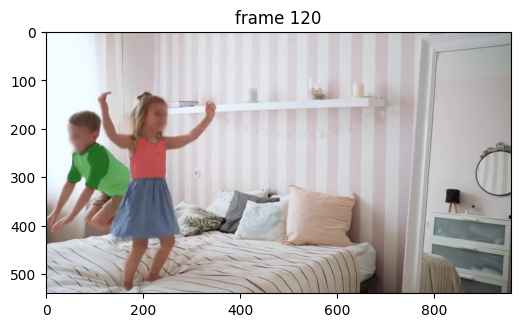

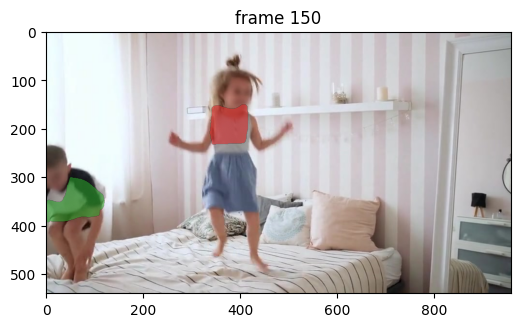

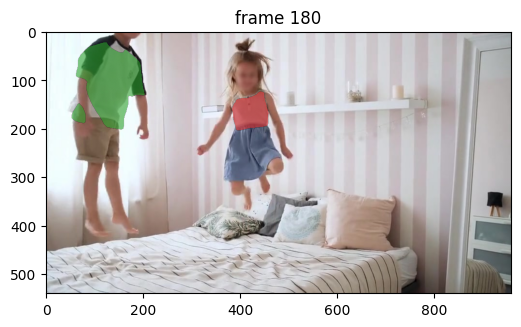

In [50]:
# run propagation throughout the video and collect the results in a dict
video_segments = {}  # video_segments contains the per-frame segmentation results
for out_frame_idx, out_obj_ids, out_mask_logits in predictor.propagate_in_video(inference_state):
    video_segments[out_frame_idx] = {
        out_obj_id: (out_mask_logits[i] > 0.0).cpu().numpy()
        for i, out_obj_id in enumerate(out_obj_ids)
    }

# render the segmentation results every few frames
vis_frame_stride = 30
plt.close("all")
for out_frame_idx in range(0, len(frame_names), vis_frame_stride):
    plt.figure(figsize=(6, 4))
    plt.title(f"frame {out_frame_idx}")
    plt.imshow(Image.open(os.path.join(video_dir, frame_names[out_frame_idx])))
    for out_obj_id, out_mask in video_segments[out_frame_idx].items():
        show_mask(out_mask, plt.gca(), obj_id=out_obj_id)

Looks like both children's shirts are well segmented in this video.

Now you can try SAM 2 on your own videos and use cases! 